In [33]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
from statsmodels.graphics.gofplots import ProbPlot
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor, OLSInfluence
from statsmodels.stats.diagnostic import het_breuschpagan, het_white
from statsmodels.nonparametric.smoothers_lowess import lowess

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import itertools

pd.options.display.float_format = "{:,.3f}".format
plt.interactive(False)
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
file = r"E:\NTU NBS\MSc in Financial Engineering\Y2MT2\FN6809 Linear Financial Models\Group Assignment\BostonHousing.csv"

In [3]:
target = 'MEDV'
data = pd.read_csv(file)
print(data.shape)
data.head()

(506, 14)


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


In [4]:
data['RAD'].value_counts()

RAD
24    132
5     115
4     110
3      38
6      26
2      24
8      24
1      20
7      17
Name: count, dtype: int64

In [5]:
Y = data[target]
X = data.loc[:, data.columns != target]
# formula = f"{Y.name} ~ {" + ".join(X.columns)}" #+ {" * ".join(X.columns)}"
formula = f"{Y.name} ~ CRIM + ZN + INDUS + C(CHAS) + NOX + RM + AGE + DIS + C(RAD) + TAX + PTRATIO + B + LSTAT"
print(formula)

MEDV ~ CRIM + ZN + INDUS + C(CHAS) + NOX + RM + AGE + DIS + C(RAD) + TAX + PTRATIO + B + LSTAT


## Linear Relationship

count   506.000
mean     22.533
std       9.197
min       5.000
25%      17.025
50%      21.200
75%      25.000
max      50.000
Name: MEDV, dtype: float64


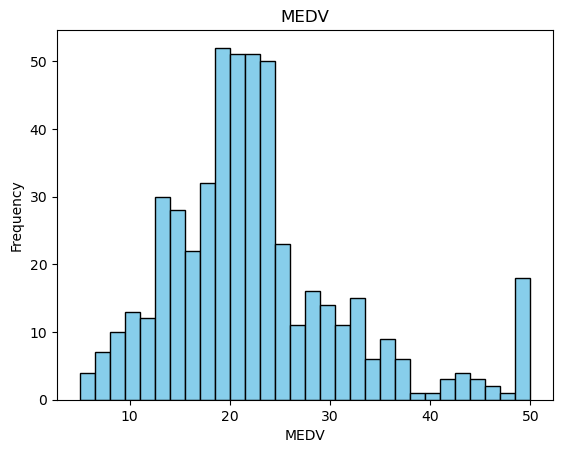

In [9]:
plt.hist(data[target], bins=30, color='skyblue', edgecolor='black')
plt.title('MEDV')
plt.xlabel('MEDV')
plt.ylabel('Frequency')
print(data['MEDV'].describe())

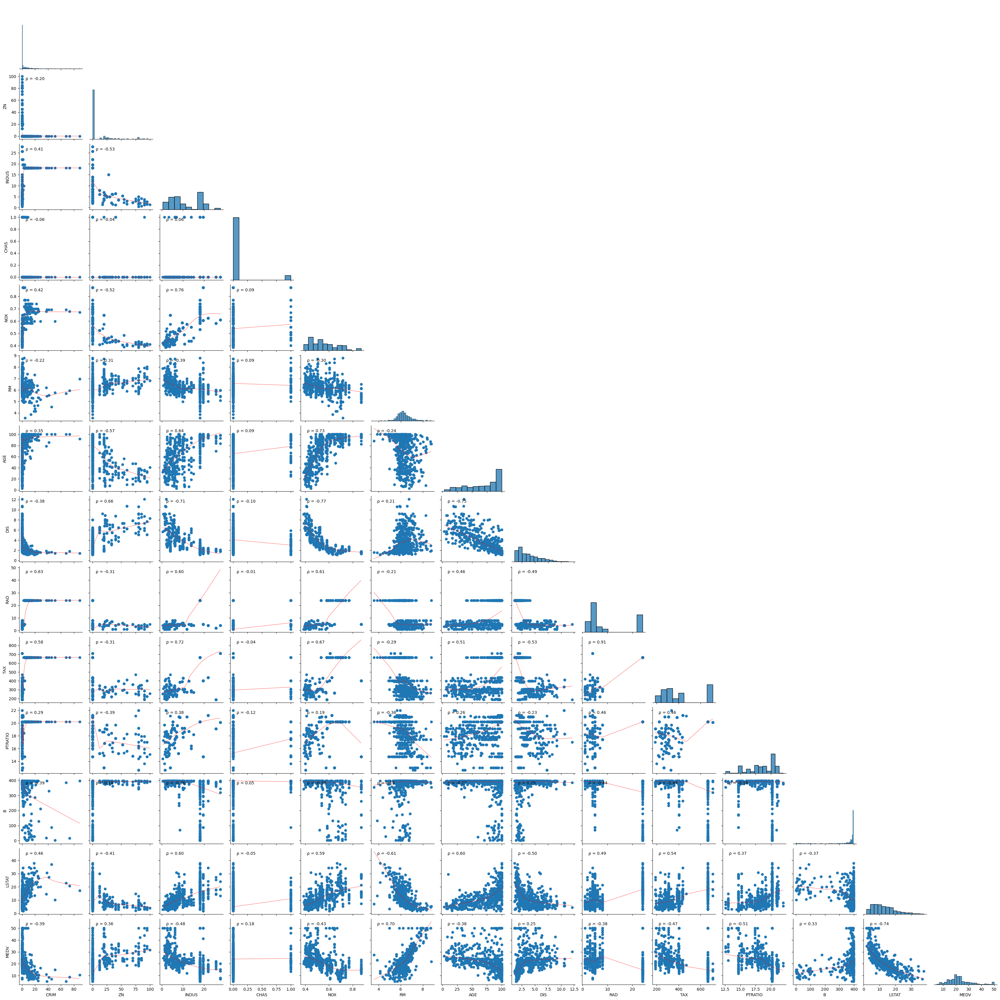

In [7]:
def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = stats.pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

g = sns.pairplot(data, corner=True)
g.map_lower(sns.regplot, lowess=True, scatter_kws={'alpha': 0.8}, line_kws={'color': 'red', 'linewidth': .5})
g.map_lower(corrfunc)
plt.show()

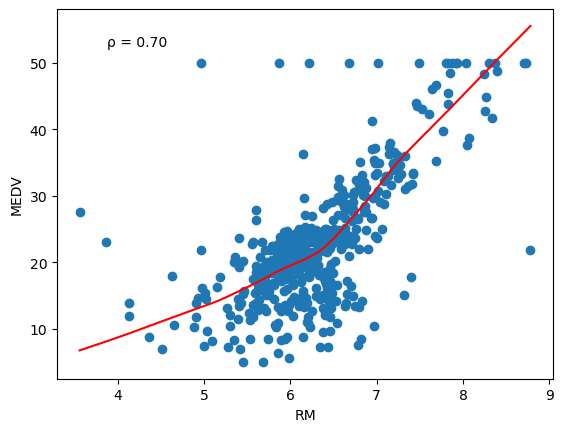

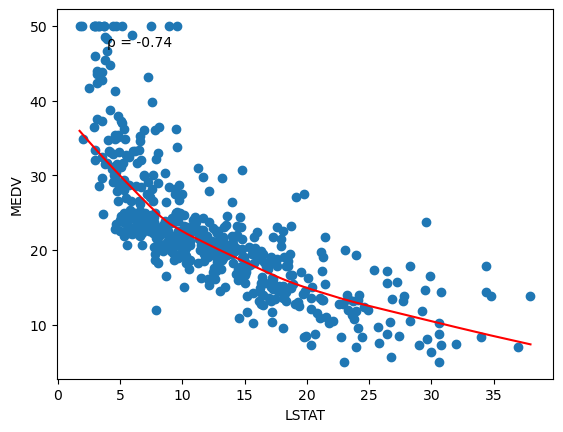

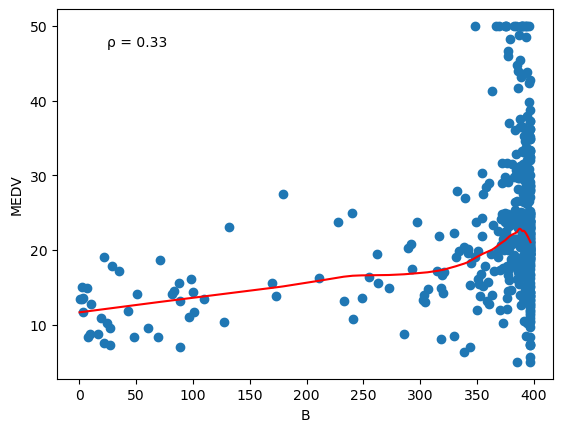

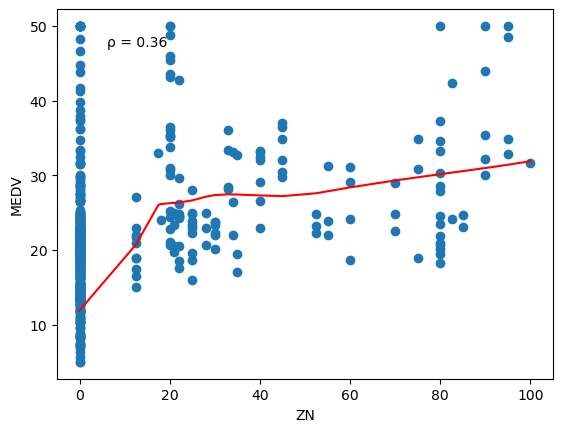

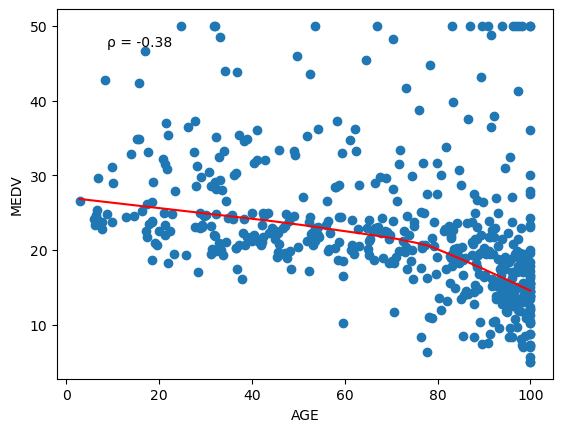

In [8]:
def plot_linearity(data, X, Y):
    lowess_ln = lowess(data[Y], data[X])
    plt.plot(lowess_ln[:,0], lowess_ln[:,-1], label='Lowess line', color='red')
    plt.scatter(data[X], data[Y])
    corrfunc(data[X], data[Y])
    plt.xlabel(X)
    plt.ylabel(Y)
    plt.show()

plot_linearity(data, X='RM', Y=target)
plot_linearity(data, X='LSTAT', Y=target)
plot_linearity(data, X='B', Y=target)
plot_linearity(data, X='ZN', Y=target)
plot_linearity(data, X='AGE', Y=target)

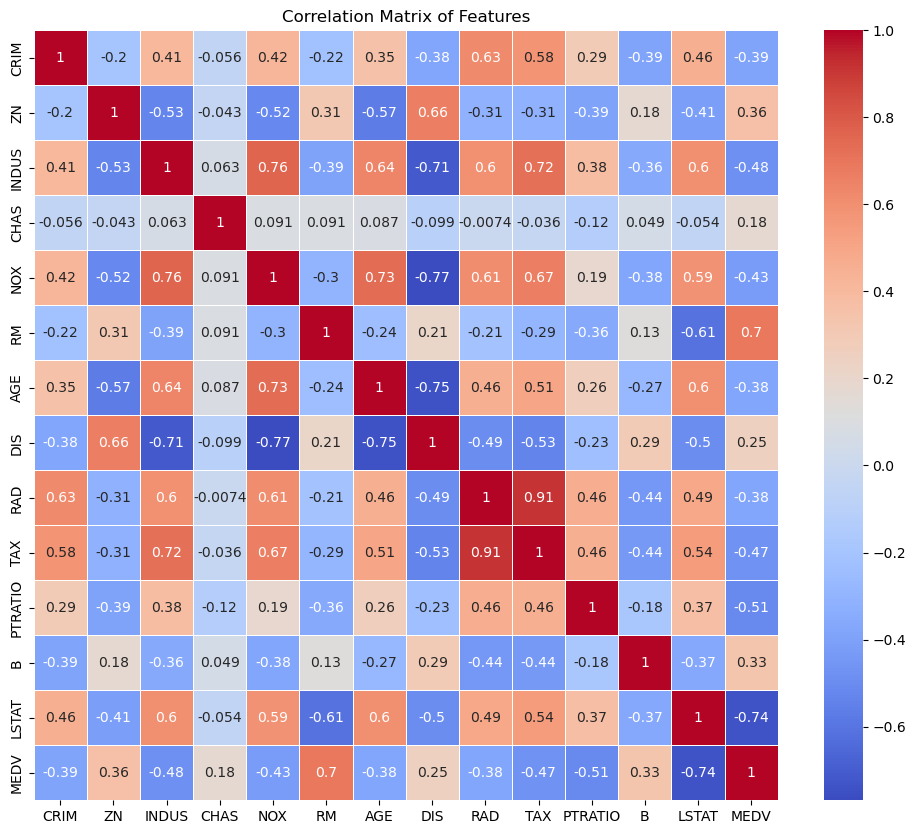

In [10]:
correlation_matrix = data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Features')
plt.show()

## Full Model Regression

In [176]:
data = pd.read_csv(file)
data.reset_index(inplace=True)
data.head()

,index,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0,0.006,18.000,2.310,0,0.538,6.575,65.200,4.090,1,296,15.300,396.900,4.980,24.000
1,1,0.027,0.000,7.070,0,0.469,6.421,78.900,4.967,2,242,17.800,396.900,9.140,21.600
2,2,0.027,0.000,7.070,0,0.469,7.185,61.100,4.967,2,242,17.800,392.830,4.030,34.700
3,3,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
4,4,0.069,0.000,2.180,0,0.458,7.147,54.200,6.062,3,222,18.700,396.900,5.330,36.200


In [194]:
data = pd.read_csv(file)
data.reset_index(inplace=True)
data_train, data_test = train_test_split(data, train_size=0.70, shuffle=True, random_state=42)
data_train.reset_index(drop=True, inplace=True)
data_test.reset_index(drop=True, inplace=True)

# data_train.to_csv(r"E:\NTU NBS\MSc in Financial Engineering\Y2MT2\FN6809 Linear Financial Models\Group Assignment\train.csv", index=False)
# data_test.to_csv(r"E:\NTU NBS\MSc in Financial Engineering\Y2MT2\FN6809 Linear Financial Models\Group Assignment\test.csv", index=False)

index_train, data_train = data_train[['index']], data_train.drop('index', axis=1)
index_test, data_test = data_test[['index']], data_test.drop('index', axis=1)

print(data_train.shape)
print(data_test.shape)

formula = f"{Y.name} ~ CRIM + ZN + INDUS + C(CHAS) + NOX + RM + AGE + DIS + C(RAD) + TAX + PTRATIO + B + LSTAT"
print(formula)

data_train.head(10)

(354, 14)
(152, 14)
MEDV ~ CRIM + ZN + INDUS + C(CHAS) + NOX + RM + AGE + DIS + C(RAD) + TAX + PTRATIO + B + LSTAT


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.030,0.000,2.180,0,0.458,6.430,58.700,6.062,3,222,18.700,394.120,5.210,28.700
1,0.132,0.000,10.010,0,0.547,6.176,72.500,2.730,6,432,17.800,393.300,12.040,21.200
2,0.171,0.000,6.910,0,0.448,5.682,33.800,5.100,3,233,17.900,396.900,10.210,19.300
3,1.054,0.000,8.140,0,0.538,5.935,29.300,4.499,4,307,21.000,386.850,6.580,23.100
4,15.576,0.000,18.100,0,0.580,5.926,71.000,2.908,24,666,20.200,368.740,18.130,19.100
5,4.542,0.000,18.100,0,0.770,6.398,88.000,2.518,24,666,20.200,374.560,7.790,25.000
6,0.032,0.000,2.180,0,0.458,6.998,45.800,6.062,3,222,18.700,394.630,2.940,33.400
7,67.921,0.000,18.100,0,0.693,5.683,100.000,1.425,24,666,20.200,384.970,22.980,5.000
8,0.060,0.000,2.460,0,0.488,6.153,68.800,3.280,3,193,17.800,387.110,13.150,29.600
9,0.149,25.000,5.130,0,0.453,5.741,66.200,7.225,8,284,19.700,395.110,13.150,18.700


In [13]:
# X = sm.add_constant(X) 
# results = sm.OLS(Y, X).fit() 
results = smf.ols(formula, data_train).fit()
print(results.summary())
results_full = results

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.754
Model:                            OLS   Adj. R-squared:                  0.739
Method:                 Least Squares   F-statistic:                     51.07
Date:                Mon, 28 Oct 2024   Prob (F-statistic):           1.02e-88
Time:                        20:14:42   Log-Likelihood:                -1046.3
No. Observations:                 354   AIC:                             2135.
Df Residuals:                     333   BIC:                             2216.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       30.1043      6.557      4.591   

In [14]:
# standardised regression
data_z = data_train.select_dtypes(include=[np.number]).dropna().apply(stats.zscore)
data_z = pd.concat([data_z, data_train.select_dtypes(exclude=[np.number])], axis=1)
# smf.ols(formula, data=data_z).fit().params.to_csv("importance.csv")
print(smf.ols(formula, data=data_z).fit().params)

Intercept                        -0.375
C(CHAS)[T.3.551814270958521]      0.312
C(RAD)[T.-0.8620839974320293]     0.121
C(RAD)[T.-0.7461790467708298]     0.481
C(RAD)[T.-0.6302740961096303]     0.202
C(RAD)[T.-0.5143691454484307]     0.295
C(RAD)[T.-0.3984641947872312]     0.049
C(RAD)[T.-0.2825592441260317]     0.457
C(RAD)[T.-0.16665429346483215]    0.423
C(RAD)[T.1.6878249171143602]      0.621
CRIM                             -0.120
ZN                                0.105
INDUS                             0.047
NOX                              -0.202
RM                                0.303
AGE                              -0.035
DIS                              -0.331
TAX                              -0.090
PTRATIO                          -0.217
B                                 0.111
LSTAT                            -0.415
dtype: float64


## Anova

In [15]:
anova_table = sm.stats.anova_lm(results, typ=1)  # Type 1 ANOVA is the basic one
# anova_table.to_csv("anova1.csv")
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
C(CHAS),1.000,"1,596.104","1,596.104",69.473,0.000
C(RAD),8.000,"7,311.544",913.943,39.781,0.000
CRIM,1.000,676.941,676.941,29.465,0.000
ZN,1.000,"1,484.288","1,484.288",64.606,0.000
INDUS,1.000,800.644,800.644,34.849,0.000
NOX,1.000,284.902,284.902,12.401,0.000
RM,1.000,"6,975.517","6,975.517",303.621,0.000
AGE,1.000,133.854,133.854,5.826,0.016
DIS,1.000,964.039,964.039,41.961,0.000
TAX,1.000,65.356,65.356,2.845,0.093


In [16]:
X = data_train.drop(columns='MEDV')
y = data_train['MEDV']
# Calculate Total Sum of Squares
ss_total = np.sum((y - np.mean(y)) ** 2)

# Regression Sum of Squares (Explained Sum of Squares)
ss_regression = np.sum((results.fittedvalues - np.mean(y)) ** 2)

# Residual Sum of Squares
ss_residual = np.sum(results.resid ** 2)

# Degrees of Freedom
df_regression = results.params.shape[0] - 1  # Number of predictors
df_residual = X.shape[0] - results.params.shape[0] # Total observations - predictors - intercept

# Mean Squares
ms_regression = ss_regression / df_regression
ms_residual = ss_residual / df_residual

# F-statistic
F_statistic = results.fvalue
p_value = results.f_pvalue


# Display the condensed ANOVA table
anova_table = pd.DataFrame({
    'Source': ['Regression', 'Residual'],
    'df': [df_regression, df_residual],
    'sum_sq': [ss_regression, ss_residual],
    'mean_sq': [ms_regression, ms_residual],
    'F': [F_statistic, None],
    'PR(>F)': [p_value, None]
})

# anova_table.to_csv('anova2.csv')
anova_table

,Source,df,sum_sq,mean_sq,F,PR(>F)
0,Regression,12,"23,464.894","1,955.408",51.067,0.000
1,Residual,341,"7,650.478",22.435,NaN,NaN


## Residual Analysis

In [13]:
def residual_plot(results, values, name, transform=None, annot=False, index=None): # need to adjust for multiregression (each X, omitted X, interaction, and across time)
    fig, ax = plt.subplots()
    influence = results.get_influence()
    residual = influence.resid_studentized_internal

    if transform == "sqaured":
        residual = np.square(np.array(residual))
    elif transform == "absolute":
        residual = np.absolute(np.array(residual))

    sns.scatterplot(x=values, y=residual, alpha = 0.8, ax=ax)
    lowess_ln = lowess(residual, values)
    sns.lineplot(x=lowess_ln[:,0], y=lowess_ln[:,-1], color='red', alpha= 0.8, ax=ax)
    ax.axhline(0, ls='--')
    
    # annotations
    if annot:
        residual_abs = np.abs(residual)
        abs_resid = np.argwhere(residual_abs >= 3)
        for i in abs_resid:
            ax.annotate(
                index_train.loc[i,:].values[0] if index is not None else i,
                xy=(values[i], residual[i]),
                color='C3')

    
    ax.set_title('Residuals Plot', fontweight="bold")
    ax.set_xlabel(name)
    ax.set_ylabel('Residuals')
    return ax

# y_predict = results.fittedvalues
# residual_plot(results, y_predict, "Fitted Values", transform=None, annot=True, index=index_train)

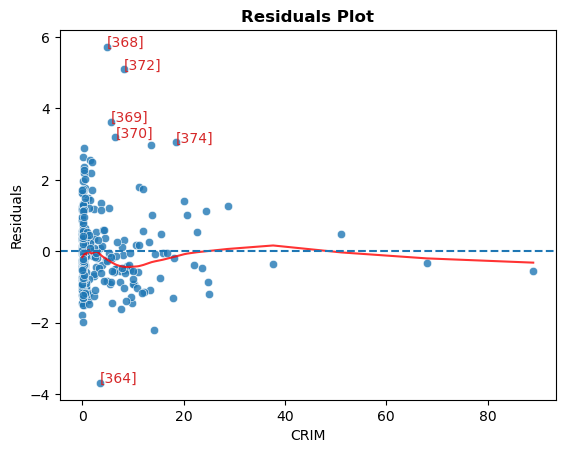

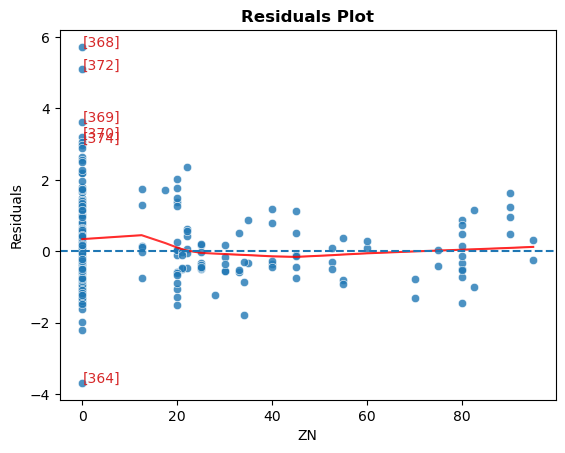

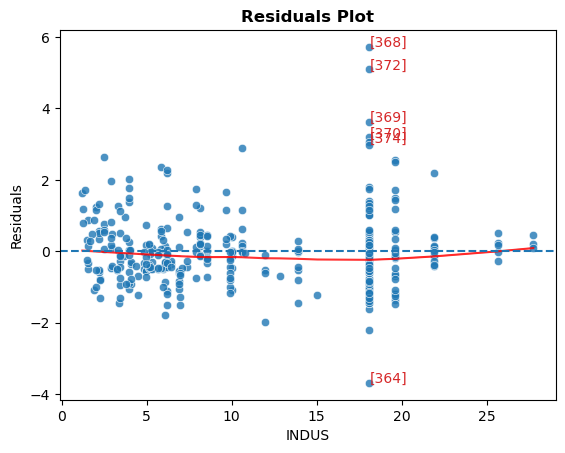

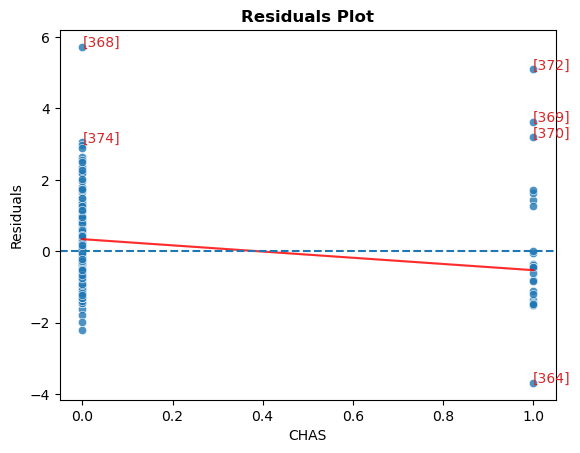

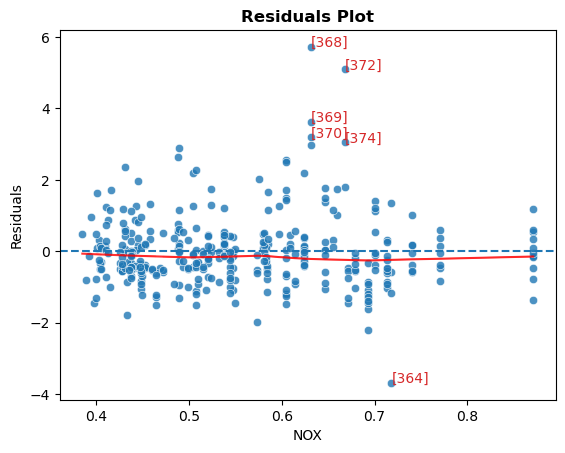

...

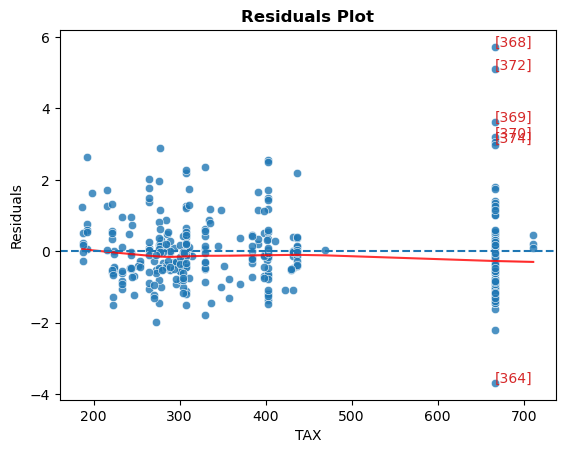

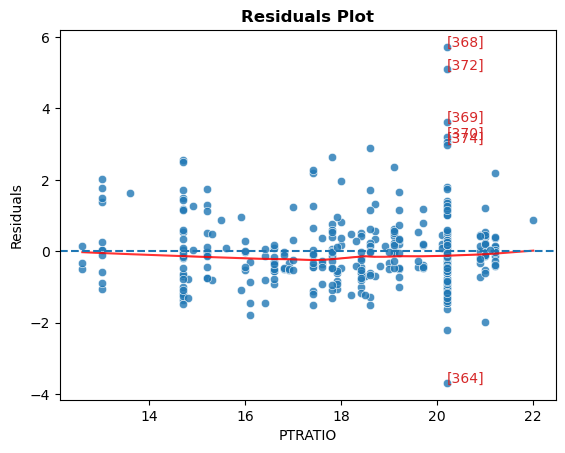

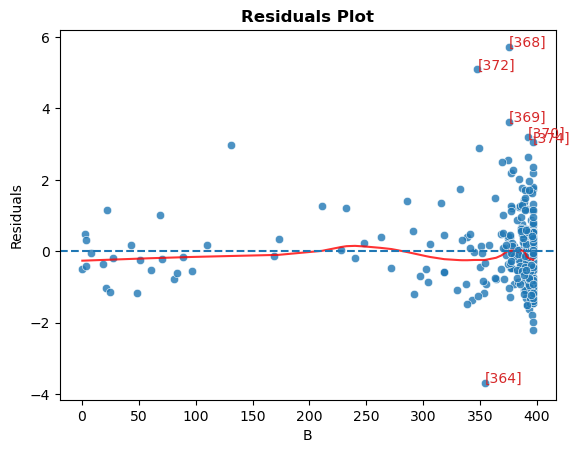

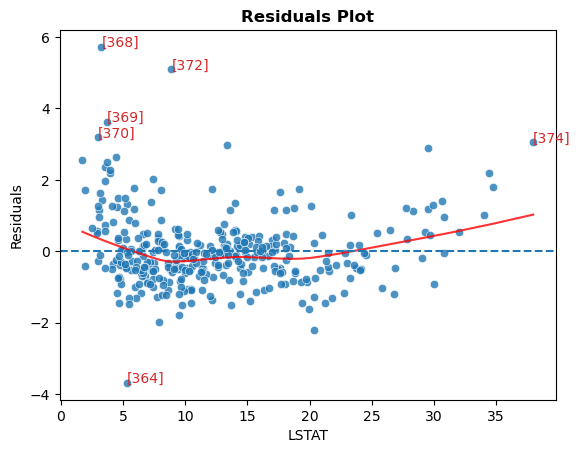

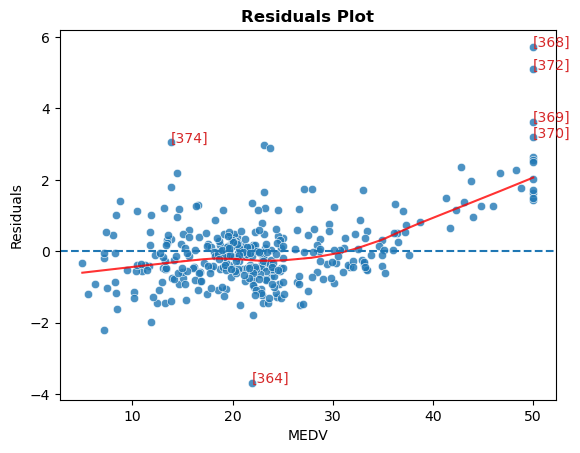

In [18]:
for x in data_train.columns:
    residual_plot(results, data_train[x], x, transform=None, annot=True, index=index_train)

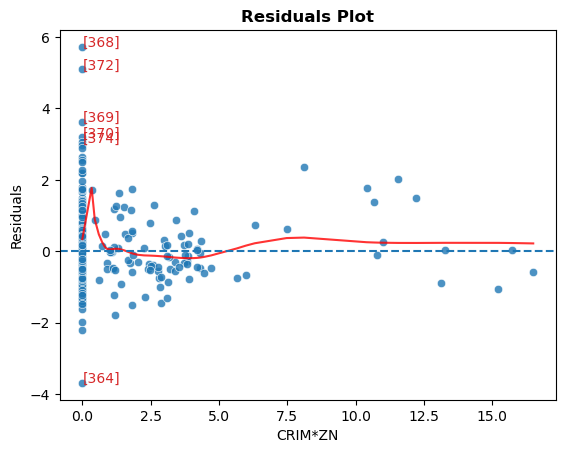

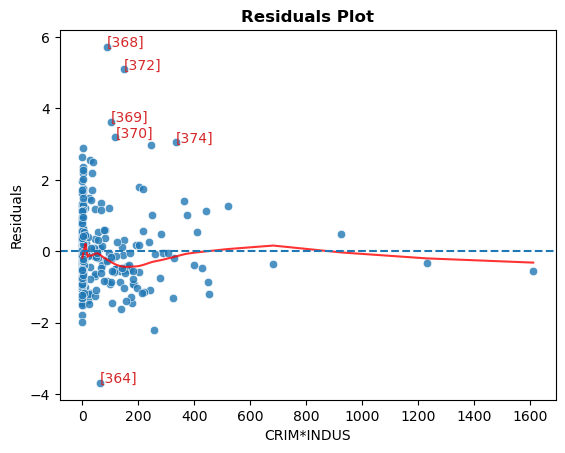

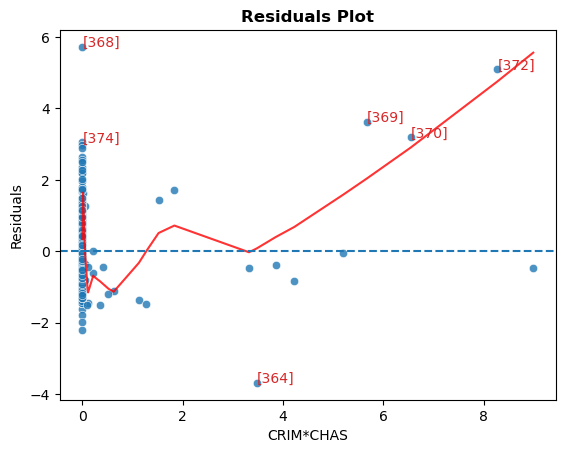

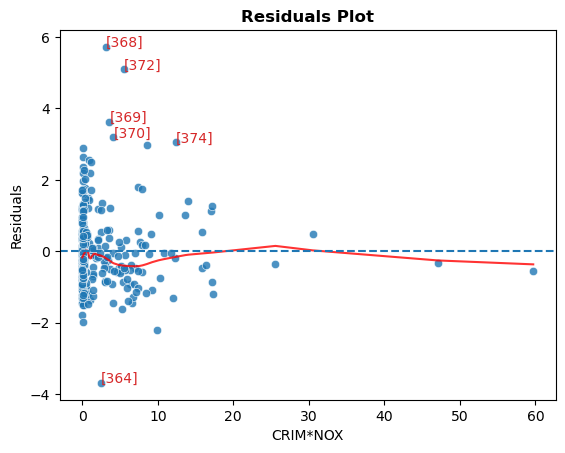

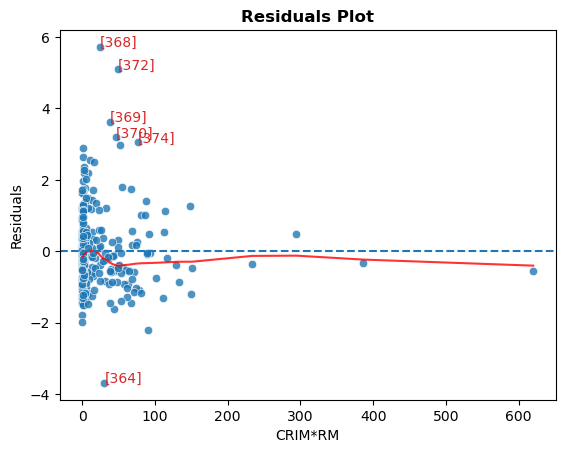

...

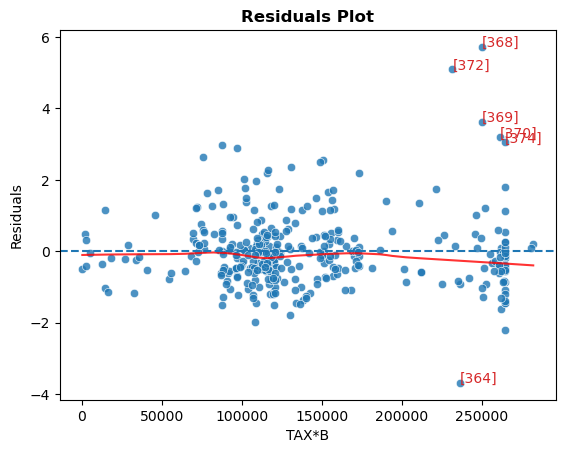

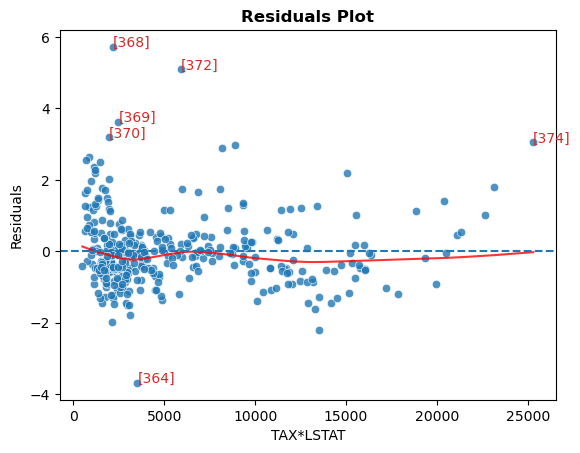

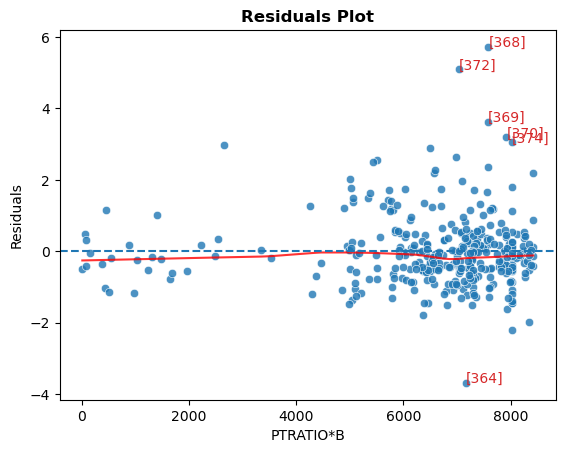

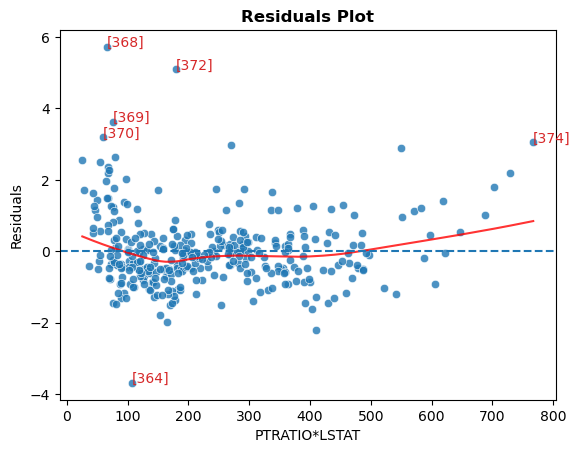

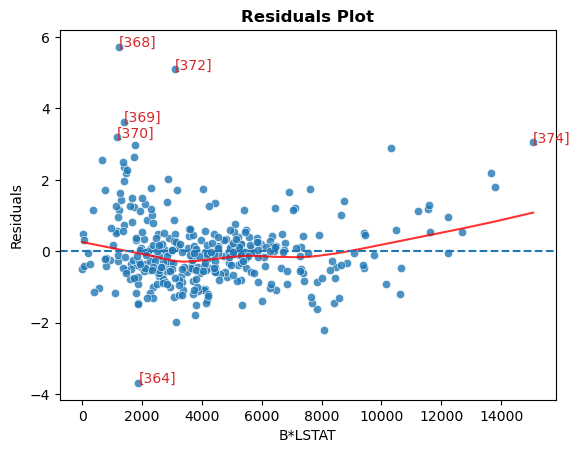

In [434]:
from itertools import combinations

interaction_vars = list(combinations(X.columns, 2))
interaction_vars
for x1, x2 in interaction_vars:
    temp_var = data_train[x1] * data_train[x2]
    residual_plot(results, temp_var, f"{x1}*{x2}", transform=None, annot=True, index=index_train)

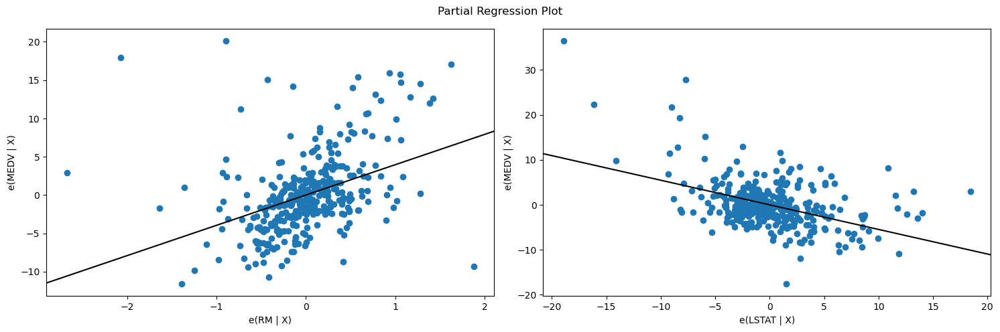

In [19]:
fig = plt.figure(figsize=(15, 5))
fig = sm.graphics.plot_partregress_grid(results, exog_idx = ['RM', 'LSTAT'], fig=fig)
fig.tight_layout(pad=1.0)

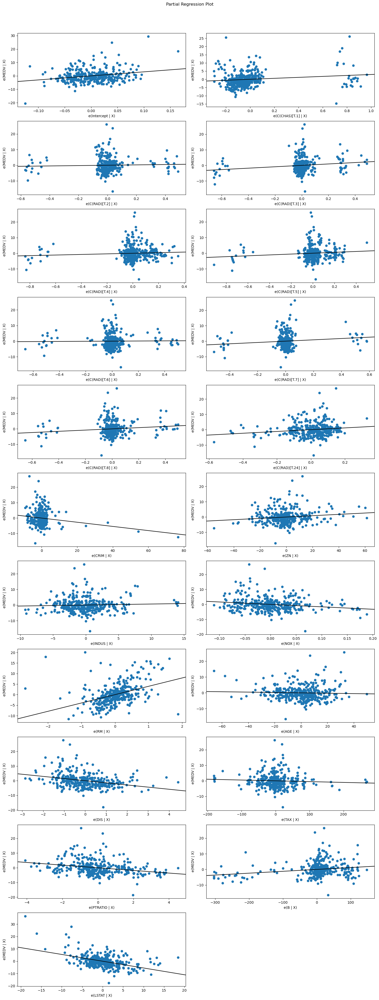

In [20]:
fig = plt.figure(figsize=(15, 40))
fig = sm.graphics.plot_partregress_grid(results, fig=fig)
# fig.tight_layout(pad=1.0)

Suggest that RM and LSTAT may be curvilinear and is important to be included

In [21]:
het_breuschpagan(results.resid, results.get_influence().exog, robust=True)

(57.56927773871007,
 1.681858152091163e-05,
 3.2335665717692526,
 5.612076468885514e-06)

## Normality

In [17]:
def qq_plot(results):
    fig, ax = plt.subplots()

    influence = results.get_influence()
    residual_norm = influence.resid_studentized_internal
    
    fig = ProbPlot(residual_norm).qqplot(line='45', alpha=0.5, lw=1, ax=ax)

    ax.set_title('Normal Q-Q', fontweight="bold")
    ax.set_xlabel('Theoretical Quantiles')
    ax.set_ylabel('Standardized Residuals')
    return ax

# qq_plot(results)
# stats.shapiro(np.array(results.resid))

## Multicolinearlity

In [14]:
def vif_table(results):
    """
    VIF table

    VIF, the variance inflation factor, is a measure of multicollinearity.
    VIF > 5 for a variable indicates that it is highly collinear with the
    other input variables.
    """
    xvar = results.model.exog
    xvar_names = results.model.exog_names
    
    vif_df = pd.DataFrame()
    vif_df["Features"] = xvar_names
    vif_df["VIF Factor"] = [variance_inflation_factor(xvar, i) for i in range(xvar.shape[1])]

    return (vif_df
            .sort_values("VIF Factor")
            .round(2))

In [24]:
vif_table(results)

,Features,VIF Factor
1,C(CHAS)[T.1],1.130
19,B,1.270
10,CRIM,1.760
7,C(RAD)[T.7],1.870
14,RM,1.990
18,PTRATIO,2.320
2,C(RAD)[T.2],2.340
6,C(RAD)[T.6],2.380
8,C(RAD)[T.8],2.380
11,ZN,2.540


## Full Model Refinement

In [195]:
# data_train = data_train.apply(lambda x: x - np.mean(x) if x.name in ['RM', 'LSTAT'] else x, axis=0)
data_train['rm'] = data_train['RM'] - np.mean(data_train['RM'])
data_train['lstat'] =  data_train['LSTAT'] - np.mean(data_train['LSTAT'])
# data_train.drop(columns=['RM', 'LSTAT'], inplace=True,)
data_train['rm2'] = np.square(data_train['rm'])
data_train['lstat2'] = np.square(data_train['lstat'])

formula = 'MEDV ~ CRIM + ZN + INDUS + C(CHAS) + NOX + rm + rm2 + AGE + DIS + C(RAD) + TAX + PTRATIO + B + lstat + lstat2'
results = smf.ols(formula, data_train).fit()
print(results.summary())
results_full = results

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.821
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     69.09
Date:                Tue, 29 Oct 2024   Prob (F-statistic):          1.57e-109
Time:                        12:11:20   Log-Likelihood:                -989.91
No. Observations:                 354   AIC:                             2026.
Df Residuals:                     331   BIC:                             2115.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       40.5639      4.485      9.045   

In [26]:
# standardised regression
data_z = data_train.select_dtypes(include=[np.number]).dropna().apply(stats.zscore)
data_z = pd.concat([data_z, data.select_dtypes(exclude=[np.number])], axis=1)
# smf.ols(formula, data=data_z).fit().params.to_csv("importance.csv")
print(smf.ols(formula, data=data_z).fit().params)

Intercept                        -0.402
C(CHAS)[T.3.551814270958521]      0.245
C(RAD)[T.-0.8620839974320293]     0.128
C(RAD)[T.-0.7461790467708298]     0.442
C(RAD)[T.-0.6302740961096303]     0.226
C(RAD)[T.-0.5143691454484307]     0.332
C(RAD)[T.-0.3984641947872312]     0.229
C(RAD)[T.-0.2825592441260317]     0.401
C(RAD)[T.-0.16665429346483215]    0.304
C(RAD)[T.1.6878249171143602]      0.697
CRIM                             -0.144
ZN                                0.067
INDUS                             0.079
NOX                              -0.197
rm                                0.218
rm2                               0.191
AGE                               0.016
DIS                              -0.240
TAX                              -0.127
PTRATIO                          -0.159
B                                 0.082
lstat                            -0.618
lstat2                            0.187
dtype: float64


In [27]:
vif_table(results)

,Features,VIF Factor
1,C(CHAS)[T.1],1.130
20,B,1.280
15,rm2,1.450
10,CRIM,1.760
7,C(RAD)[T.7],1.880
14,rm,2.110
22,lstat2,2.330
2,C(RAD)[T.2],2.350
19,PTRATIO,2.370
8,C(RAD)[T.8],2.400


In [33]:
X = data_train.drop(columns='MEDV')
y = data_train['MEDV']
# Calculate Total Sum of Squares
ss_total = np.sum((y - np.mean(y)) ** 2)

# Regression Sum of Squares (Explained Sum of Squares)
ss_regression = np.sum((results.fittedvalues - np.mean(y)) ** 2)

# Residual Sum of Squares
ss_residual = np.sum(results.resid ** 2)

# Degrees of Freedom
df_regression = results.params.shape[0] - 1  # Number of predictors
df_residual = X.shape[0] - results.params.shape[0] # Total observations - predictors - intercept

# Mean Squares
ms_regression = ss_regression / df_regression
ms_residual = ss_residual / df_residual

# F-statistic
F_statistic = results.fvalue
p_value = results.f_pvalue


# Display the condensed ANOVA table
anova_table = pd.DataFrame({
    'Source': ['Regression', 'Residual'],
    'df': [df_regression, df_residual],
    'sum_sq': [ss_regression, ss_residual],
    'mean_sq': [ms_regression, ms_residual],
    'F': [F_statistic, None],
    'PR(>F)': [p_value, None]
})

# anova_table.to_csv('anova2.csv')
anova_table

,Source,df,sum_sq,mean_sq,F,PR(>F)
0,Regression,22,"25,551.158","1,161.416",69.090,0.000
1,Residual,331,"5,564.213",16.810,NaN,NaN


<Axes: title={'center': 'Residuals Plot'}, xlabel='Fitted Values', ylabel='Residuals'>

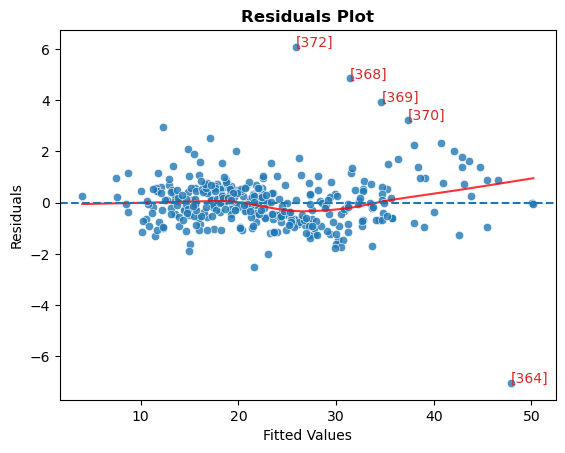

In [34]:
y_predict = results.fittedvalues
residual_plot(results, y_predict, "Fitted Values", transform=None, annot=True, index=index_train)

In [554]:
het_breuschpagan(results.resid, results.get_influence().exog, robust=True)

(76.81331731279425,
 5.3774567056039e-08,
 4.169360746018866,
 4.524197318784264e-09)

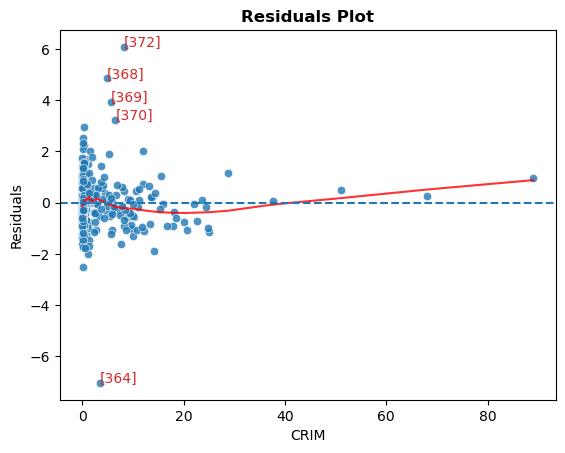

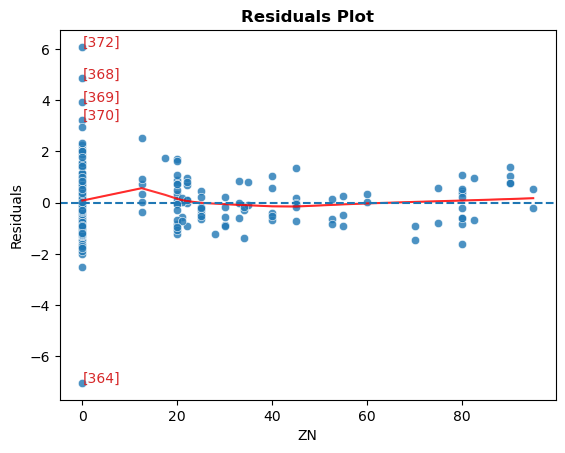

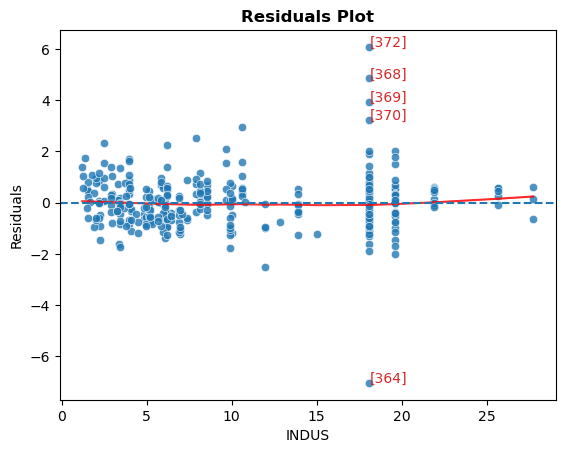

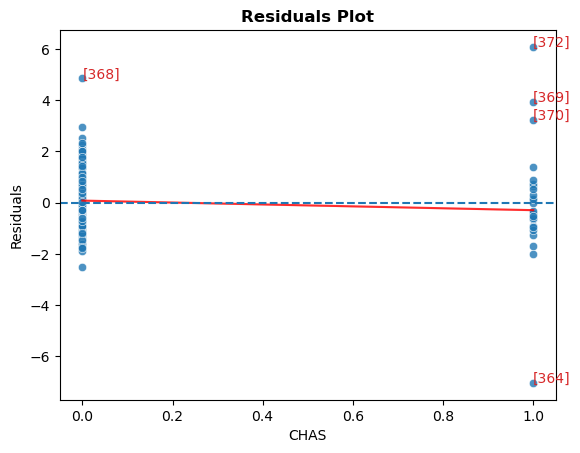

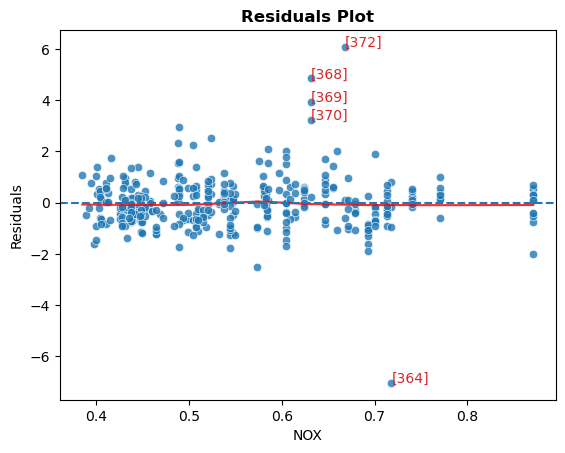

...

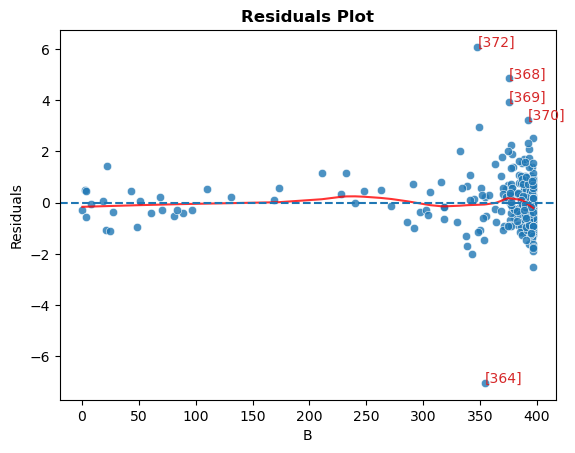

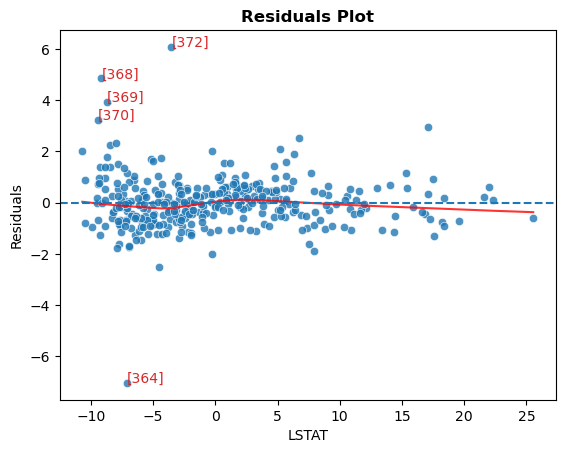

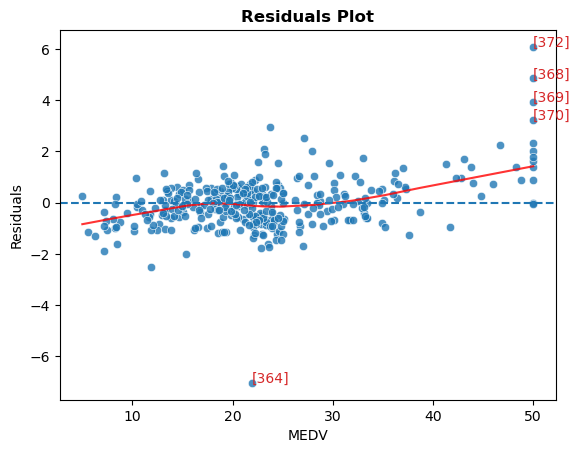

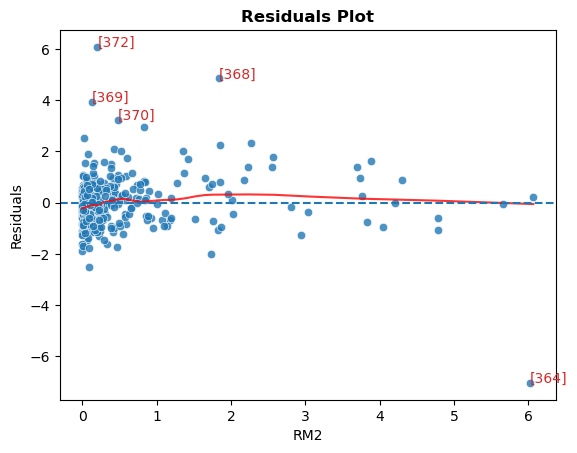

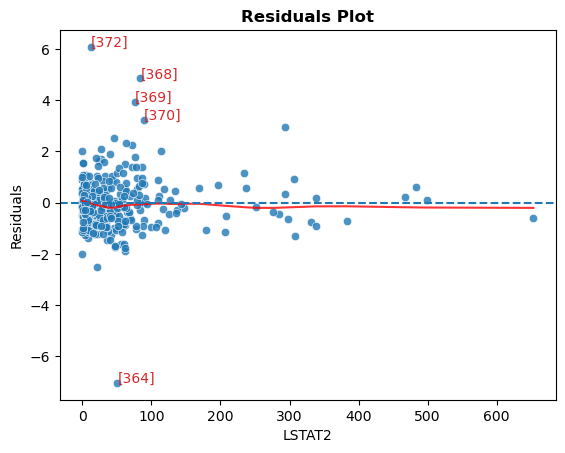

In [552]:
for x in data_train.columns:
    residual_plot(results, data_train[x], x, transform=None, annot=True, index=index_train)

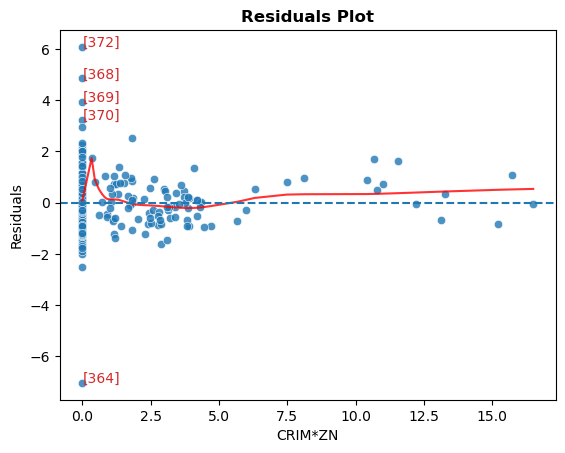

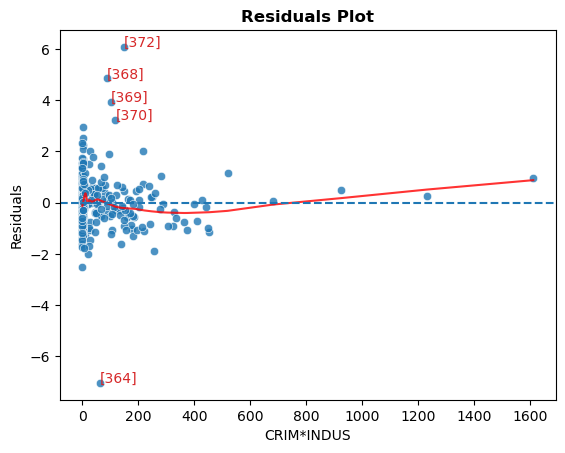

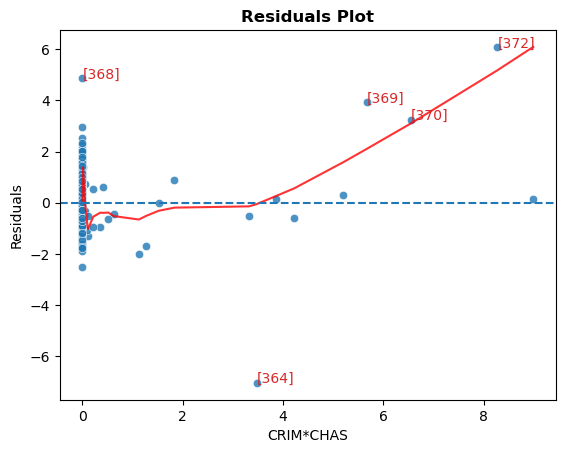

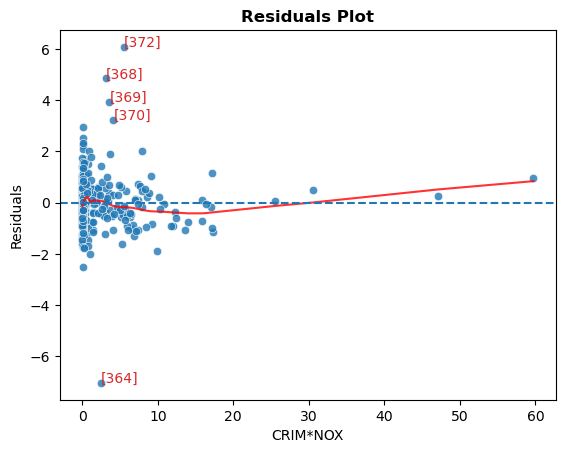

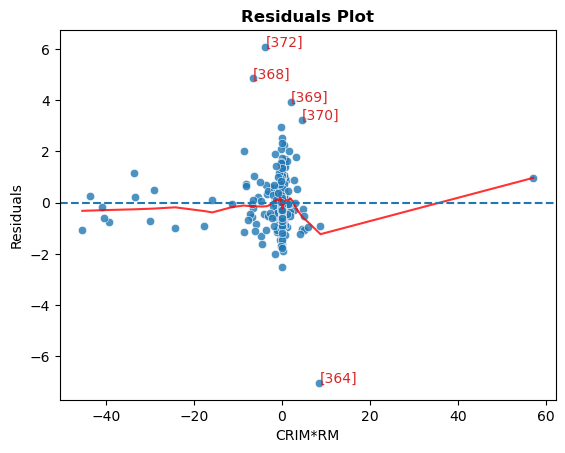

...

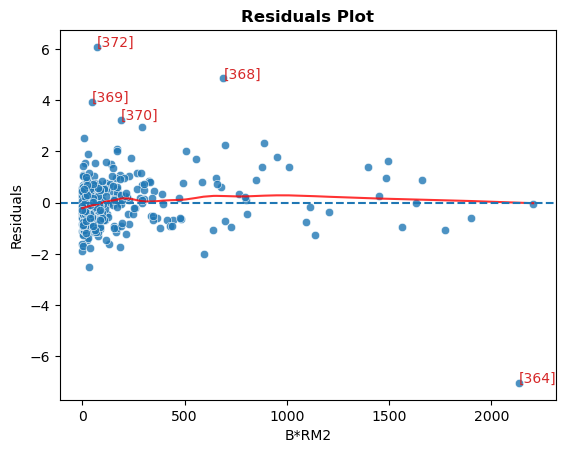

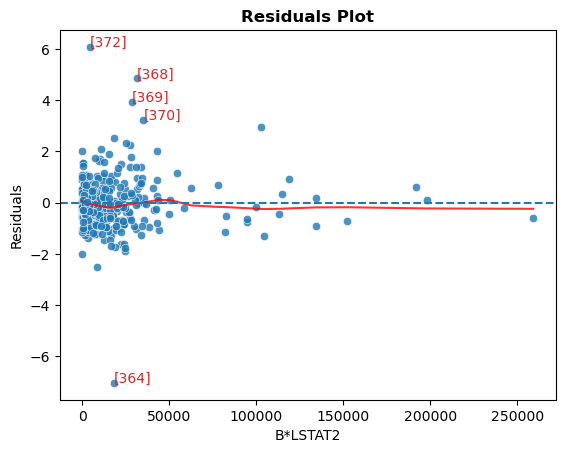

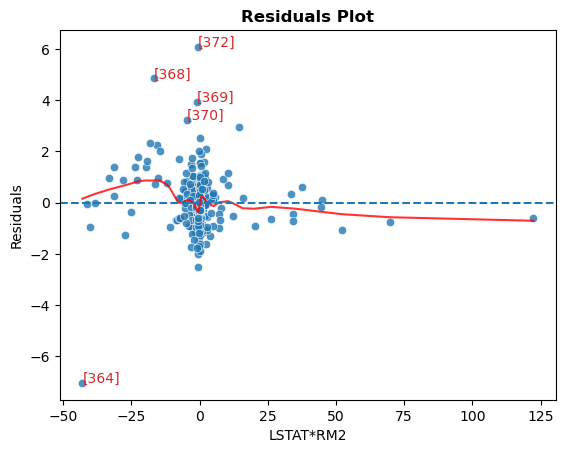

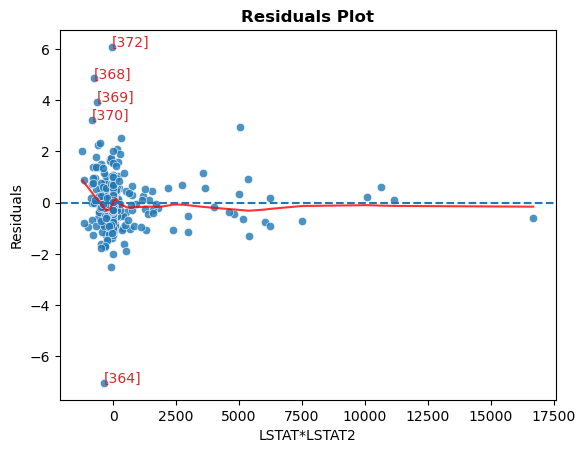

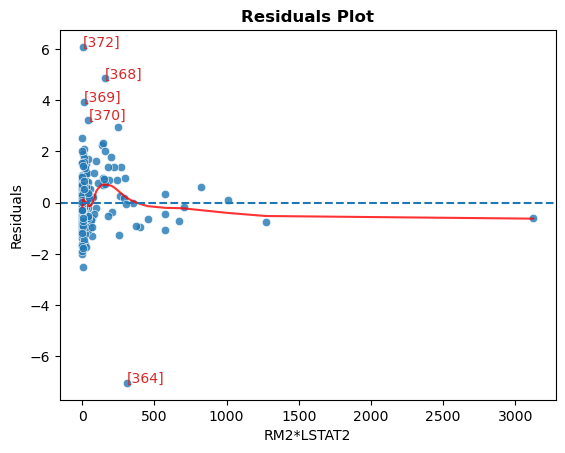

In [553]:
from itertools import combinations

interaction_vars = list(combinations(X.columns, 2))
interaction_vars
for x1, x2 in interaction_vars:
    temp_var = data_train[x1] * data_train[x2]
    residual_plot(results, temp_var, f"{x1}*{x2}", transform=None, annot=True, index=index_train)

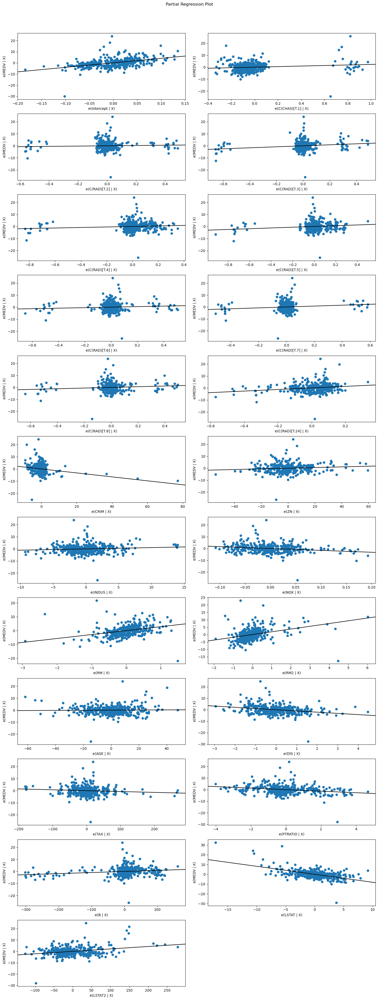

In [555]:
fig = plt.figure(figsize=(15, 40))
fig = sm.graphics.plot_partregress_grid(results, fig=fig)
# fig.tight_layout(pad=1.0)

ShapiroResult(statistic=0.8880270890094031, pvalue=2.032605003845541e-15)

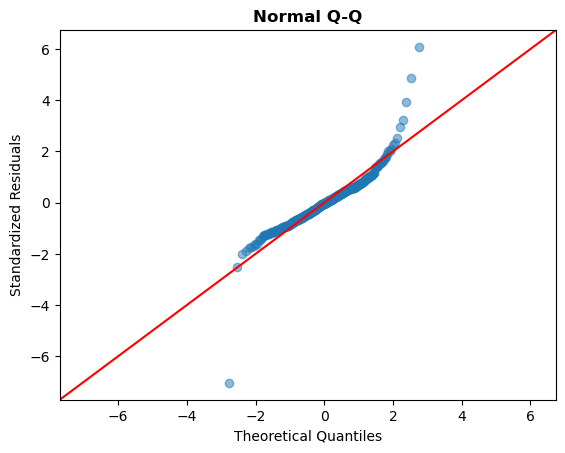

In [35]:
qq_plot(results)
stats.shapiro(np.array(results.resid))

## Outlier Analysis

In [197]:
def outlier_analysis(results, index):
    influence = OLSInfluence(results)
    cooks_d = influence.cooks_distance[0]
    dffits = influence.dffits[0]
    dfbetas = influence.dfbetas
    outlier_df = pd.concat([pd.DataFrame(index), pd.DataFrame(dffits), pd.DataFrame(cooks_d), pd.DataFrame(dfbetas)], axis=1)
    outlier_df.columns = ['id','DFFITS', 'Cooks', ] + [f"beta_{i}" for i in range(dfbetas.shape[1])]
    return outlier_df

outlier_df = outlier_analysis(results, index=index_train)
# outlier_df.to_csv('outlier1.csv')
outlier_df.sort_values('Cooks', ascending=False).head(20)

,id,DFFITS,Cooks,beta_0,beta_1,beta_2,beta_3,beta_4,beta_5,beta_6,...,beta_13,beta_14,beta_15,beta_16,beta_17,beta_18,beta_19,beta_20,beta_21,beta_22
85,364,-3.696,0.506,0.944,-1.198,-0.077,-0.040,-0.111,-0.134,-0.254,...,-0.463,-1.358,-2.516,0.432,-0.687,-0.100,-0.903,-0.077,-0.517,0.824
76,368,1.910,0.148,-0.044,-0.287,-0.001,0.012,0.048,-0.017,0.106,...,-0.191,-1.364,0.200,0.751,-0.143,-0.057,-0.068,-0.021,-1.508,0.800
338,372,1.675,0.109,-0.023,1.187,0.089,0.008,0.023,-0.027,0.030,...,-0.057,-0.610,-0.275,0.188,-0.263,0.127,0.044,-0.028,-0.617,0.231
36,369,1.255,0.065,-0.092,0.683,0.039,0.006,0.043,0.003,0.092,...,-0.127,-0.256,-0.397,0.369,-0.073,0.083,0.043,0.020,-0.732,0.595
342,214,1.040,0.046,0.341,0.047,-0.069,-0.104,0.066,-0.028,-0.072,...,-0.080,0.157,0.032,-0.677,-0.283,-0.134,-0.069,-0.000,0.474,0.100
143,370,1.035,0.045,-0.105,0.542,0.024,0.004,0.038,0.006,0.085,...,-0.102,-0.121,-0.291,0.294,-0.058,0.068,0.063,0.058,-0.591,0.506
138,380,0.896,0.035,-0.092,0.026,0.013,0.011,0.004,0.007,0.006,...,0.059,0.181,-0.048,-0.075,0.052,0.018,0.044,0.149,0.055,-0.108
345,505,-0.826,0.029,-0.065,0.070,0.527,0.572,0.657,0.608,0.483,...,-0.067,0.130,0.061,-0.046,0.145,0.135,-0.210,0.002,0.206,-0.115
68,228,0.763,0.025,0.059,-0.136,-0.027,-0.018,-0.033,-0.032,-0.030,...,0.108,0.174,0.043,-0.454,-0.180,0.024,0.023,0.007,0.039,0.029
49,152,-0.730,0.023,0.162,-0.379,-0.069,-0.035,0.011,0.002,0.008,...,-0.371,0.307,-0.155,0.093,-0.103,-0.043,0.019,0.071,0.111,0.088


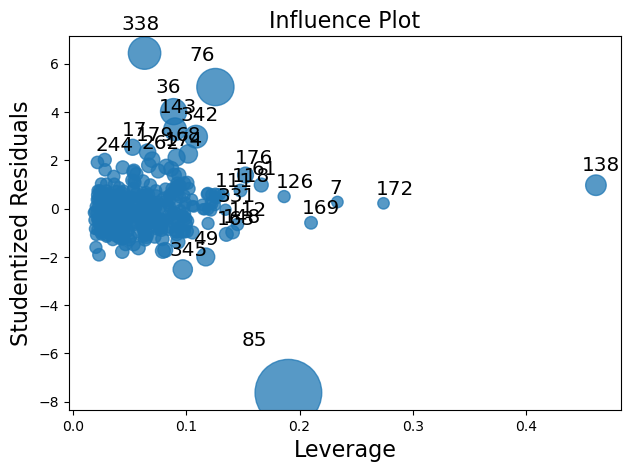

In [563]:
fig = sm.graphics.influence_plot(results, criterion="cooks")
fig.tight_layout(pad=1.0)

In [189]:
influence = OLSInfluence(results)
cooks_d = influence.cooks_distance[0]
influential_points = np.where(cooks_d > 4/data_train.shape[0])[0]
print(len(influential_points))

influential_points

17


array([ 17,  36,  49,  68,  76,  85, 138, 143, 174, 176, 179, 237, 262,
       293, 338, 342, 345], dtype=int64)

In [198]:
data_train_no_outliers = data_train.drop(influential_points).reset_index(drop=True)
index_train_no_outliers = index_train.drop(influential_points).reset_index(drop=True)

data_train_no_outliers

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,rm,lstat,rm2,lstat2
0,0.030,0.000,2.180,0,0.458,6.430,58.700,6.062,3,222,18.700,394.120,5.210,28.700,0.104,-7.211,0.011,52.000
1,0.132,0.000,10.010,0,0.547,6.176,72.500,2.730,6,432,17.800,393.300,12.040,21.200,-0.150,-0.381,0.022,0.145
2,0.171,0.000,6.910,0,0.448,5.682,33.800,5.100,3,233,17.900,396.900,10.210,19.300,-0.644,-2.211,0.414,4.889
3,1.054,0.000,8.140,0,0.538,5.935,29.300,4.499,4,307,21.000,386.850,6.580,23.100,-0.391,-5.841,0.153,34.119
4,15.576,0.000,18.100,0,0.580,5.926,71.000,2.908,24,666,20.200,368.740,18.130,19.100,-0.400,5.709,0.160,32.591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332,0.171,0.000,8.560,0,0.520,5.836,91.900,2.211,5,384,20.900,395.670,18.660,19.500,-0.490,6.239,0.240,38.923
333,0.299,20.000,6.960,0,0.464,5.856,42.100,4.429,3,223,18.600,388.650,13.000,21.100,-0.470,0.579,0.221,0.335
334,0.015,80.000,2.010,0,0.435,6.635,29.700,8.344,4,280,17.000,390.940,5.990,24.500,0.309,-6.431,0.096,41.359
335,11.160,0.000,18.100,0,0.740,6.629,94.600,2.125,24,666,20.200,109.850,23.270,13.400,0.303,10.849,0.092,117.698


## Full Model

In [200]:
formula = 'MEDV ~ CRIM + ZN + INDUS + C(CHAS) + NOX + rm + rm2 + AGE + DIS + C(RAD) + TAX + PTRATIO + B + lstat + lstat2'
results = smf.ols(formula, data_train_no_outliers).fit()
print(results.summary())
results_full = results

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.903
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                     133.6
Date:                Tue, 29 Oct 2024   Prob (F-statistic):          5.02e-145
Time:                        12:12:28   Log-Likelihood:                -809.11
No. Observations:                 337   AIC:                             1664.
Df Residuals:                     314   BIC:                             1752.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       35.8032      3.152     11.359   

In [44]:
# standardised regression
data_z = data_train_no_outliers.select_dtypes(include=[np.number]).dropna().apply(stats.zscore)
data_z = pd.concat([data_z, data_train_no_outliers.select_dtypes(exclude=[np.number])], axis=1)
# smf.ols(formula, data=data_z).fit().params.to_csv("importance.csv")
print(smf.ols(formula, data=data_z).fit().params)

Intercept                        -0.326
C(CHAS)[T.3.981205847478877]      0.164
C(RAD)[T.-0.8596960326576467]     0.165
C(RAD)[T.-0.7428744346715068]     0.412
C(RAD)[T.-0.6260528366853669]     0.190
C(RAD)[T.-0.509231238699227]      0.332
C(RAD)[T.-0.3924096407130871]     0.153
C(RAD)[T.-0.2755880427269472]     0.350
C(RAD)[T.-0.15876644474080734]    0.226
C(RAD)[T.1.710379123037431]       0.504
CRIM                             -0.128
ZN                                0.070
INDUS                             0.080
NOX                              -0.137
rm                                0.316
rm2                               0.277
AGE                              -0.036
DIS                              -0.195
TAX                              -0.133
PTRATIO                          -0.134
B                                 0.086
lstat                            -0.485
lstat2                            0.083
dtype: float64


In [571]:
vif_table(results)

,Features,VIF Factor
1,C(CHAS)[T.1],1.100
20,B,1.310
15,RM2,1.460
7,C(RAD)[T.7],2.000
10,CRIM,2.250
14,RM,2.320
19,PTRATIO,2.340
6,C(RAD)[T.6],2.480
2,C(RAD)[T.2],2.500
8,C(RAD)[T.8],2.530


In [48]:
X = data_train_no_outliers.drop(columns='MEDV')
y = data_train_no_outliers['MEDV']
# Calculate Total Sum of Squares
ss_total = np.sum((y - np.mean(y)) ** 2)

# Regression Sum of Squares (Explained Sum of Squares)
ss_regression = np.sum((results.fittedvalues - np.mean(y)) ** 2)

# Residual Sum of Squares
ss_residual = np.sum(results.resid ** 2)

# Degrees of Freedom
df_regression = results.params.shape[0] - 1  # Number of predictors
df_residual = X.shape[0] - results.params.shape[0] # Total observations - predictors - intercept

# Mean Squares
ms_regression = ss_regression / df_regression
ms_residual = ss_residual / df_residual

# F-statistic
F_statistic = results.fvalue
p_value = results.f_pvalue


# Display the condensed ANOVA table
anova_table = pd.DataFrame({
    'Source': ['Regression', 'Residual'],
    'df': [df_regression, df_residual],
    'sum_sq': [ss_regression, ss_residual],
    'mean_sq': [ms_regression, ms_residual],
    'F': [F_statistic, None],
    'PR(>F)': [p_value, None]
})

# anova_table.to_csv('anova2.csv')
anova_table

,Source,df,sum_sq,mean_sq,F,PR(>F)
0,Regression,22,"22,481.460","1,021.885",133.589,0.000
1,Residual,314,"2,401.936",7.649,NaN,NaN


<Axes: title={'center': 'Residuals Plot'}, xlabel='Fitted Values', ylabel='Residuals'>

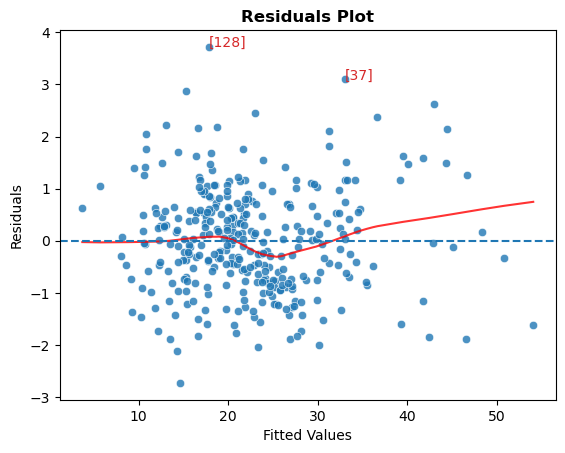

In [52]:
y_predict = results.fittedvalues
residual_plot(results, y_predict, "Fitted Values", transform=None, annot=True, index=index_train_no_outliers)

In [575]:
het_breuschpagan(results.resid, results.get_influence().exog, robust=True)

(38.07159647423147,
 0.017985814622938922,
 1.8177781264843558,
 0.01479154987773726)

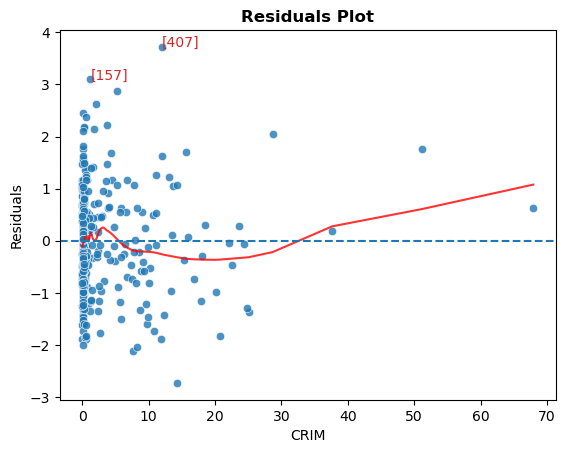

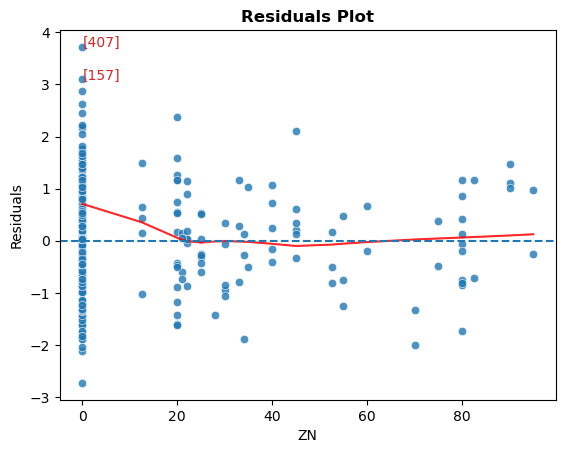

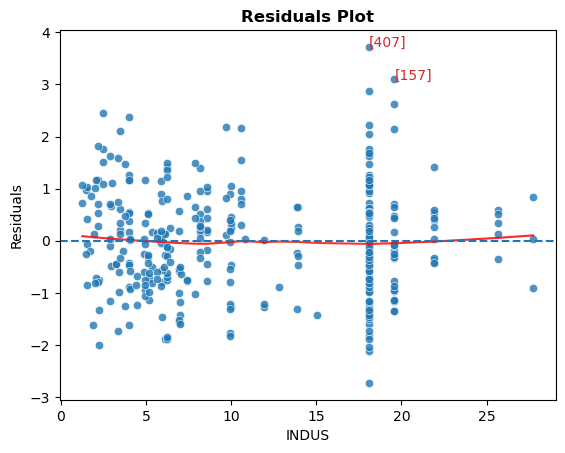

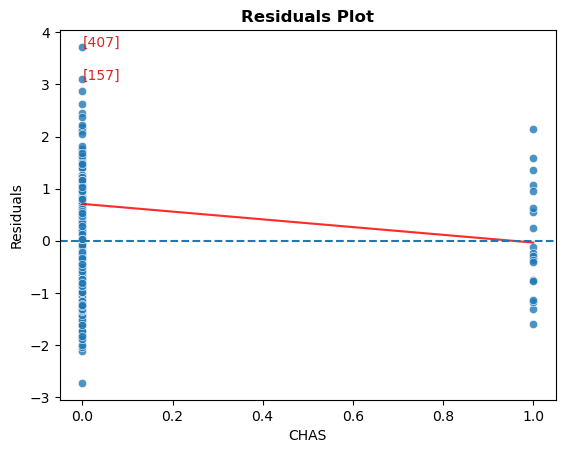

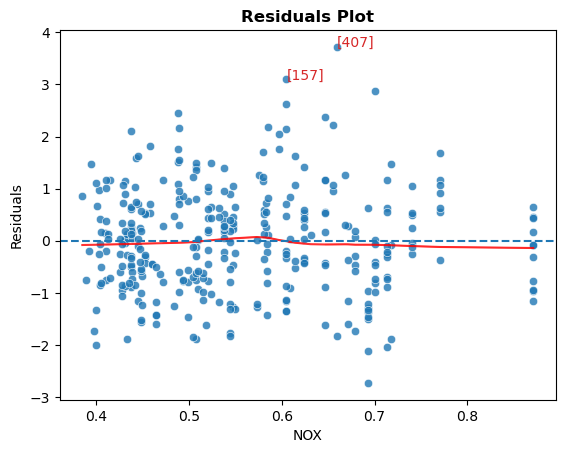

...

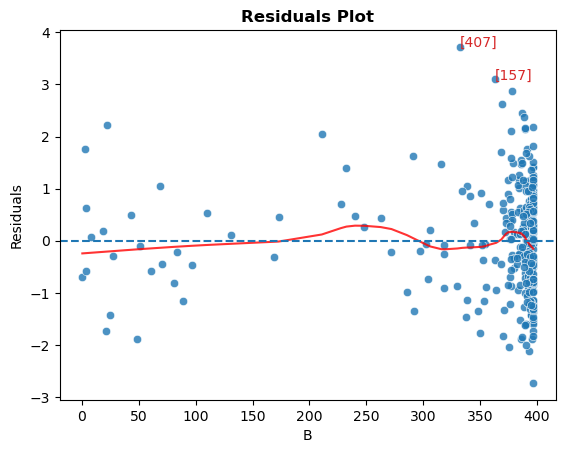

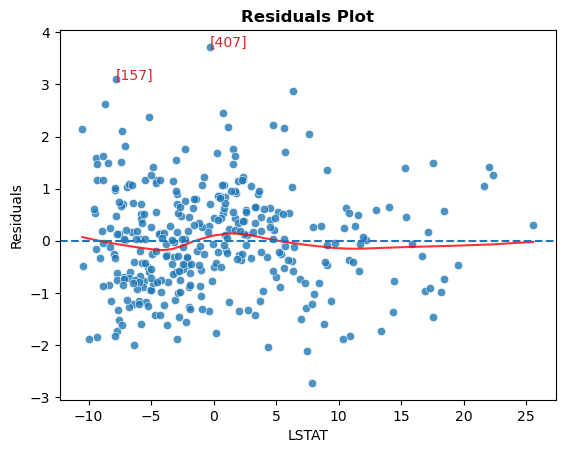

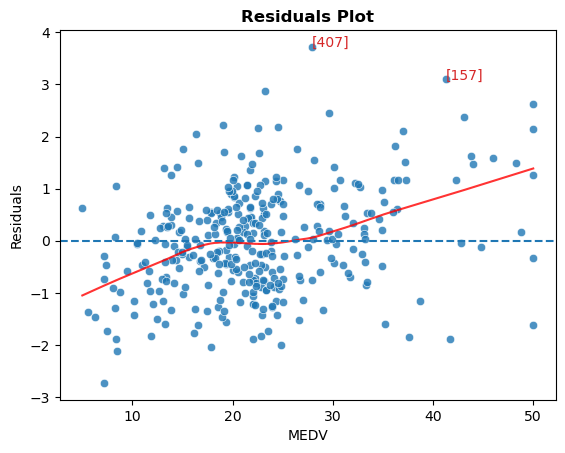

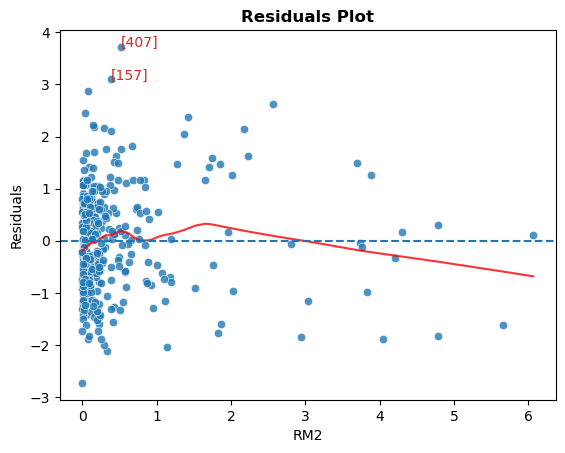

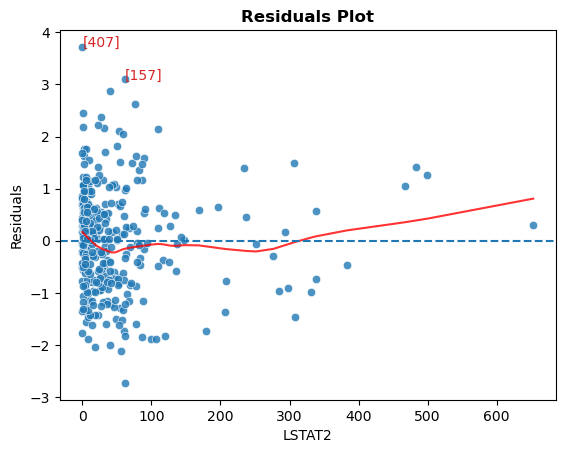

In [576]:
for x in data_train.columns:
    residual_plot(results, data_train[x], x, transform=None, annot=True, index=index_train)

ShapiroResult(statistic=0.9917840946038102, pvalue=0.05875503418078386)

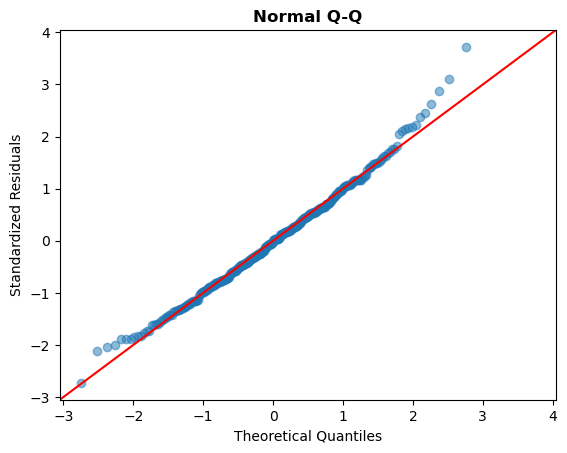

In [53]:
qq_plot(results)
stats.shapiro(np.array(results.resid))

## Automatic Search - Candidate Models

In [61]:
# forward regression
def ols_forward_selection(df, y, alpha=0.05, categorical=[]):
    X_ls = []
    X = [col for col in df.columns if col != y]
    
    # get the x with the highest correlation with y
    X_ls.append(df.corr().abs().sort_values(by=y, ascending=False).loc[:,[y]].iloc[1,].name)
    print(X_ls)
    
    formula = f"{y} ~ {" + ".join(X_ls)}"
    results = smf.ols(formula, df).fit()
    
    while True:
        partial_f_ls = {}
        
        print("Forward")
        for temp_x in [col for col in X if col not in X_ls]:
            if temp_x in categorical:
                temp_formula = formula + f" + C({temp_x})"
            else:
                temp_formula = formula + f" + {temp_x}"
            temp_res = smf.ols(temp_formula, df).fit()
            
            if temp_x in categorical:
                hypotheses = ", ".join([f"({i} = 0)" for i in temp_res.params.index if temp_x in i])
            else:
                hypotheses = f'({temp_x} = 0)'
#             hypotheses = f'({temp_x} = 0)'
            f_test = temp_res.f_test(hypotheses)
            partial_f_ls[temp_x] = f_test.pvalue
            # print(f"\t{temp_x}: {f_test.pvalue}")
            
        # get maximum f-stats or min p-value to be added
        if min(partial_f_ls.values()) <= alpha:
            X_ls.append(min(partial_f_ls, key=partial_f_ls.get))
            temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
            formula = f"{y} ~ {" + ".join(temp_vars)}"
            results = smf.ols(formula, df).fit()
            print(f"{min(partial_f_ls, key=partial_f_ls.get)} is added with p-value: {min(partial_f_ls.values())}")
                    
        else:
#             print(f"Final list: {formula}")
            break
            
    temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
    formula = f"{y} ~ {" + ".join(temp_vars)}"
    results = smf.ols(formula, df).fit()
    print(formula)
    print(results.summary())
    return X_ls

ols_forward_selection(data_train_no_outliers, y=target, categorical=['CHAS', 'RAD'])

['lstat']
Forward
rm2 is added with p-value: 1.634972645393317e-38
Forward
rm is added with p-value: 1.5861606124320742e-27
Forward
PTRATIO is added with p-value: 7.245859925079006e-14
Forward
CRIM is added with p-value: 3.126233256938427e-08
Forward
B is added with p-value: 1.5525282445083528e-05
Forward
RAD is added with p-value: 0.0009317550495352939
Forward
lstat2 is added with p-value: 0.0038612228366512974
Forward
DIS is added with p-value: 0.0003360798521220585
Forward
NOX is added with p-value: 0.0003150200001628467
Forward
CHAS is added with p-value: 0.016082822062222925
Forward
MEDV ~ lstat + rm2 + rm + PTRATIO + CRIM + B + C(RAD) + lstat2 + DIS + NOX + C(CHAS)
                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.900
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     158.1
Date

['lstat',
 'rm2',
 'rm',
 'PTRATIO',
 'CRIM',
 'B',
 'RAD',
 'lstat2',
 'DIS',
 'NOX',
 'CHAS']

In [62]:
# backward regression
def ols_backward_selection(df, y, alpha=0.05, categorical=[]):
    X_ls = [i for i in df.columns.tolist() if i != y]
    print(X_ls)
    
    while True:
        partial_f_ls = {}
        
        temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
        formula = f"{y} ~ {" + ".join(temp_vars)}"
        
        temp_res = smf.ols(formula, df).fit()

        for temp_x in [col for col in X_ls]:            
            if temp_x in categorical:
                hypotheses = ", ".join([f"({i} = 0)" for i in temp_res.params.index if temp_x in i])
            else:
                hypotheses = f'({temp_x} = 0)'
#             hypotheses = f'({temp_x} = 0)'
            f_test = temp_res.f_test(hypotheses)
            partial_f_ls[temp_x] = f_test.pvalue
            # print(f"\t{temp_x}: {f_test.pvalue}")
            
        # get min f-stats or max p-value to be removed
        if max(partial_f_ls.values()) >= alpha:
            X_ls.remove(max(partial_f_ls, key=partial_f_ls.get))
            temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
            formula = f"{y} ~ {" + ".join(temp_vars)}"
            results = smf.ols(formula, df).fit()
            print(f"{max(partial_f_ls, key=partial_f_ls.get)} is removed with p-value: {max(partial_f_ls.values())}")
                    
        else:
#             print(f"Final list: {formula}")
            break
            
    temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
    formula = f"{y} ~ {" + ".join(temp_vars)}"
    results = smf.ols(formula, df).fit()
    print(formula)
    print(results.summary())
    return X_ls

ols_backward_selection(data_train_no_outliers, y=target, categorical=['CHAS', 'RAD'])

['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'rm', 'lstat', 'rm2', 'lstat2']
AGE is removed with p-value: 0.2913530124367591
MEDV ~ CRIM + ZN + INDUS + C(CHAS) + NOX + DIS + C(RAD) + TAX + PTRATIO + B + rm + lstat + rm2 + lstat2
                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.903
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                     139.8
Date:                Mon, 28 Oct 2024   Prob (F-statistic):          7.29e-146
Time:                        21:55:01   Log-Likelihood:                -809.71
No. Observations:                 337   AIC:                             1663.
Df Residuals:                     315   BIC:                             1747.
Df Model:                          21                                         
Covariance Type:      

['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'rm',
 'lstat',
 'rm2',
 'lstat2']

In [63]:
# stepwise regression
def ols_stepwise_selection(df, y, alpha=0.05, categorical=[]):
    X_ls = []
    X = [col for col in df.columns if col != y]
    
    # get the x with the highest correlation with y
    X_ls.append(df.corr().abs().sort_values(by=y, ascending=False).loc[:,[y]].iloc[1,].name)
    print(X_ls)
    
    formula = f"{y} ~ {" + ".join(X_ls)}"
    results = smf.ols(formula, df).fit()
    
    while True:
        partial_f_ls = {}
        
        print("Forward")
        for temp_x in [col for col in X if col not in X_ls]:
            if temp_x in categorical:
                temp_formula = formula + f" + C({temp_x})"
            else:
                temp_formula = formula + f" + {temp_x}"
            temp_res = smf.ols(temp_formula, df).fit()
            
            if temp_x in categorical:
                hypotheses = ", ".join([f"({i} = 0)" for i in temp_res.params.index if temp_x in i])
            else:
                hypotheses = f'({temp_x} = 0)'
#             hypotheses = f'({temp_x} = 0)'
            f_test = temp_res.f_test(hypotheses)
            partial_f_ls[temp_x] = f_test.pvalue
            # print(f"\t{temp_x}: {f_test.pvalue}")
            
        # get maximum f-stats or min p-value to be added
        if min(partial_f_ls.values()) <= alpha:
            X_ls.append(min(partial_f_ls, key=partial_f_ls.get))
            temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
            formula = f"{y} ~ {" + ".join(temp_vars)}"
            results = smf.ols(formula, df).fit()
            print(f"{min(partial_f_ls, key=partial_f_ls.get)} is added with p-value: {min(partial_f_ls.values())}")
            
            # delete any variable that does not produce a significant partial f-stats
            print("Backward")
            for temp_x in X_ls:
                if temp_x in categorical:
                    hypotheses = ", ".join([f"({i} = 0)" for i in results.params.index if temp_x in i])
                else:
                    hypotheses = f'({temp_x} = 0)'
                f_test = results.f_test(hypotheses)
                # print(f"\t{temp_x}: {f_test.pvalue}")
                if f_test.pvalue > alpha:
                    X_ls.remove(temp_x)
                    print(f"{temp_x} is removed with p-value {f_test.pvalue}")
                    
        else:
#             print(f"Final list: {formula}")
            break
            
    temp_vars = [f"C({i})" if (i in categorical) else i for i in X_ls]
    formula = f"{y} ~ {" + ".join(temp_vars)}"
    results = smf.ols(formula, df).fit()
    print(formula)
    print(results.summary())
    return X_ls

ols_stepwise_selection(data_train_no_outliers, y=target, categorical=['CHAS', 'RAD'])

['lstat']
Forward
rm2 is added with p-value: 1.634972645393317e-38
Backward
Forward
rm is added with p-value: 1.5861606124320742e-27
Backward
Forward
PTRATIO is added with p-value: 7.245859925079006e-14
Backward
Forward
CRIM is added with p-value: 3.126233256938427e-08
Backward
Forward
B is added with p-value: 1.5525282445083528e-05
Backward
Forward
RAD is added with p-value: 0.0009317550495352939
Backward
Forward
lstat2 is added with p-value: 0.0038612228366512974
Backward
Forward
DIS is added with p-value: 0.0003360798521220585
Backward
Forward
NOX is added with p-value: 0.0003150200001628467
Backward
Forward
CHAS is added with p-value: 0.016082822062222925
Backward
Forward
MEDV ~ lstat + rm2 + rm + PTRATIO + CRIM + B + C(RAD) + lstat2 + DIS + NOX + C(CHAS)
                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.900
Model:                            OLS   Adj. R-squared:                 

['lstat',
 'rm2',
 'rm',
 'PTRATIO',
 'CRIM',
 'B',
 'RAD',
 'lstat2',
 'DIS',
 'NOX',
 'CHAS']

Suggest P = 11 variables may be be ideal

# All Regression Search

In [192]:
full_model = results

In [65]:
def mallows_cp(results_p, results_full):
    n = results_full.nobs
    if n != results_p.nobs:
        raise ValueError("The number of observations for the two full and reduced model does not matched")
    
    mse_full = results_full.ssr / (n - len(results_full.params))
    sse_p = results_p.ssr

    p = len(results_p.params)
    cp = (sse_p / mse_full) - (n - 2*p)
    return cp

def press_p(residuals, results):
    influence = results.get_influence()
    standardized_residuals = influence.resid_studentized_external
    hat_matrix_diag = influence.hat_matrix_diag
    PRESS_residuals = residuals / (1 - hat_matrix_diag)
    PRESS = np.sum(PRESS_residuals ** 2)
    return PRESS

In [76]:
from itertools import combinations
from tqdm import tqdm

categorical = ['RAD', 'CHAS']
all_regress_df = pd.DataFrame(columns=['formula', 'p', 'SSE', 'rsquared', 'rsquared_adj', 'Cp', 'AIC', 'BIC', 'PRESS'])

X = data_train_no_outliers.drop(columns='MEDV')

for combi in tqdm([i for i in combinations(X.columns, 11)]):
    temp_vars = [f"C({i})" if (i in categorical) else i for i in combi]
    formula = f"{target} ~ {" + ".join(temp_vars)}"
    temp_results = smf.ols(formula, data_train_no_outliers).fit()
    
    all_regress_df.loc[len(all_regress_df)] = [formula,
                                               temp_results.params.shape[0],
                                               temp_results.ssr,
                                                temp_results.rsquared,
                                                temp_results.rsquared_adj,
                                               mallows_cp(temp_results, full_model),
                                               temp_results.aic,
                                                temp_results.bic,
                                               press_p(temp_results.resid, results)]
    
for combi in tqdm([i for i in combinations(X.columns, 10)]):
    temp_vars = [f"C({i})" if (i in categorical) else i for i in combi]
    formula = f"{target} ~ {" + ".join(temp_vars)}"
    temp_results = smf.ols(formula, data_train_no_outliers).fit()
    
    all_regress_df.loc[len(all_regress_df)] = [formula,
                                               temp_results.params.shape[0],
                                               temp_results.ssr,
                                                temp_results.rsquared,
                                                temp_results.rsquared_adj,
                                               mallows_cp(temp_results, full_model),
                                               temp_results.aic,
                                                temp_results.bic,
                                               press_p(temp_results.resid, results)]

100%|██████████████████████████████████████████████████████████████████████████████| 3003/3003 [19:31<00:00,  2.56it/s]


In [741]:
# for combi in tqdm([i for i in combinations(X.columns, 12)]):
#     temp_vars = [f"C({i})" if (i in categorical) else i for i in combi]
#     formula = f"{target} ~ {" + ".join(temp_vars)}"
#     temp_results = smf.ols(formula, data_train).fit()
    
#     all_regress_df.loc[len(all_regress_df)] = [formula,
#                                                temp_results.params.shape[0],
#                                                temp_results.ssr,
#                                                 temp_results.rsquared,
#                                                 temp_results.rsquared_adj,
#                                                mallows_cp(temp_results, full_model),
#                                                temp_results.aic,
#                                                 temp_results.bic,
#                                                press_p(temp_results.resid, results)]

100%|████████████████████████████████████████████████████████████████████████████████| 455/455 [03:03<00:00,  2.49it/s]


In [88]:
all_regress_df.sort_values('PRESS').head()

,formula,p,SSE,rsquared,rsquared_adj,Cp,AIC,BIC,PRESS
977,MEDV ~ CRIM + C(CHAS) + NOX + DIS + C(RAD) + P...,19,"2,500.632",0.900,0.894,27.902,"1,669.785","1,742.367","2,892.687"
702,MEDV ~ CRIM + ZN + NOX + DIS + C(RAD) + PTRATI...,19,"2,518.715",0.899,0.893,30.266,"1,672.213","1,744.795","2,913.367"
999,MEDV ~ CRIM + NOX + DIS + C(RAD) + TAX + PTRAT...,19,"2,529.171",0.898,0.893,31.633,"1,673.610","1,746.191","2,926.718"
922,MEDV ~ CRIM + INDUS + NOX + DIS + C(RAD) + PTR...,19,"2,532.745",0.898,0.892,32.100,"1,674.085","1,746.667","2,931.180"
996,MEDV ~ CRIM + NOX + AGE + DIS + C(RAD) + PTRAT...,19,"2,536.335",0.898,0.892,32.570,"1,674.563","1,747.144","2,941.484"


In [87]:
all_regress_df.sort_values('PRESS').head(10)['formula'].iloc[:3]

['MEDV ~ CRIM + C(CHAS) + NOX + DIS + C(RAD) + PTRATIO + B + rm + lstat + rm2 + lstat2',
 'MEDV ~ CRIM + ZN + NOX + DIS + C(RAD) + PTRATIO + B + rm + lstat + rm2 + lstat2',
 'MEDV ~ CRIM + NOX + DIS + C(RAD) + TAX + PTRATIO + B + rm + lstat + rm2 + lstat2']

## Candidate Models

In [201]:
data_test['rm'] = data_test['RM'] - np.mean(data_train['RM'])
data_test['lstat'] =  data_test['LSTAT'] - np.mean(data_train['LSTAT'])
# data_test.drop(columns=['RM', 'LSTAT'], inplace=True,)
data_test['rm2'] = np.square(data_test['rm'])
data_test['lstat2'] = np.square(data_test['lstat'])

In [202]:
full_formula = 'MEDV ~ CRIM + ZN + INDUS + C(CHAS) + NOX + rm + rm2 + AGE + DIS + C(RAD) + TAX + PTRATIO + B + lstat + lstat2'

In [203]:
df_candidate_valid = pd.DataFrame()

for i, temp_formula in enumerate(all_regress_df.sort_values('PRESS').head(10)['formula'].iloc[:3].to_list()):
    train_results = smf.ols(temp_formula, data_train_no_outliers).fit()
#     foo = train_results.bse
#     foo.index = [f'S({i})' for i in foo.index]
#     train_df = pd.concat([train_results.params, foo])
    train_df = train_results.params
    train_df["P"] = train_results.params.shape[0]
    train_df["Cp"] = mallows_cp(train_results, full_model)
    train_df["PRESSp"] = press_p(train_results.resid, train_results)
    train_df["MSE"] = train_results.mse_resid
    train_df["MSPR"] = np.mean(np.square(data_test['MEDV'] - train_results.get_prediction(data_test).predicted))
    train_df["rsquared_adj"] = train_results.rsquared_adj
    train_df.name = f'Model {i+1} Training Data'

    test_results = smf.ols(temp_formula, data_test).fit()
    full_valid_model = smf.ols(full_formula, data_test).fit()
#     foo = test_results.bse
#     foo.index = [f'S({i})' for i in foo.index]
#     test_df = pd.concat([test_results.params, foo])
    test_df = test_results.params
    test_df["P"] = test_results.params.shape[0]
    test_df["Cp"] = mallows_cp(test_results, full_valid_model)
    test_df["PRESSp"] = press_p(test_results.resid, test_results)
    test_df["MSE"] = test_results.mse_resid
    test_df["MSPR"] = np.nan
    test_df["rsquared_adj"] = test_results.rsquared_adj
    test_df.name = f'Model {i+1}  Validation Data'
    
    df_candidate_valid = pd.concat([df_candidate_valid, train_df, test_df], axis=1)
# df_candidate_valid.to_csv('candidates.csv')
df_candidate_valid

,Model 1 Training Data,Model 1 Validation Data,Model 2 Training Data,Model 2 Validation Data,Model 3 Training Data,Model 3 Validation Data
Intercept,35.080,45.600,34.311,46.805,36.027,50.354
C(CHAS)[T.1],1.628,2.344,NaN,NaN,NaN,NaN
C(RAD)[T.2],1.832,2.535,1.849,2.649,1.621,1.664
C(RAD)[T.3],3.487,4.507,3.829,4.918,3.418,3.833
C(RAD)[T.4],1.585,2.476,1.815,2.798,1.733,3.223
C(RAD)[T.5],2.462,2.284,2.711,2.775,2.563,2.510
C(RAD)[T.6],0.798,2.236,0.902,2.133,0.974,3.018
C(RAD)[T.7],2.848,3.662,3.103,4.014,2.879,3.884
C(RAD)[T.8],1.236,2.008,1.947,3.349,1.525,3.022
C(RAD)[T.24],2.628,4.413,2.752,4.256,3.901,8.757


In [147]:
all_regress_df.sort_values('PRESS').head(10)['formula'].iloc[2]

'MEDV ~ CRIM + NOX + DIS + C(RAD) + TAX + PTRATIO + B + rm + lstat + rm2 + lstat2'

In [148]:
formula = 'MEDV ~ CRIM + NOX + DIS + C(RAD) + TAX + PTRATIO + B + rm + lstat + rm2 + lstat2'
results = smf.ols(formula, data_train_no_outliers).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.898
Model:                            OLS   Adj. R-squared:                  0.893
Method:                 Least Squares   F-statistic:                     156.1
Date:                Tue, 29 Oct 2024   Prob (F-statistic):          7.18e-146
Time:                        00:04:09   Log-Likelihood:                -817.80
No. Observations:                 337   AIC:                             1674.
Df Residuals:                     318   BIC:                             1746.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       36.0269      3.155     11.419   

(31.90124347379196, 0.022586533965708266, 1.8472334699772717, 0.01965640907503224)


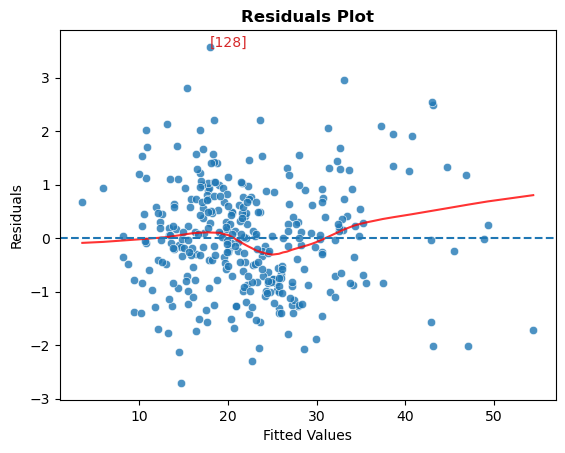

In [149]:
y_predict = results.fittedvalues
residual_plot(results, y_predict, "Fitted Values", transform=None, annot=True, index=index_train)
print(het_breuschpagan(results.resid, results.get_influence().exog, robust=True))

ShapiroResult(statistic=0.993981837002343, pvalue=0.20311764355006495)

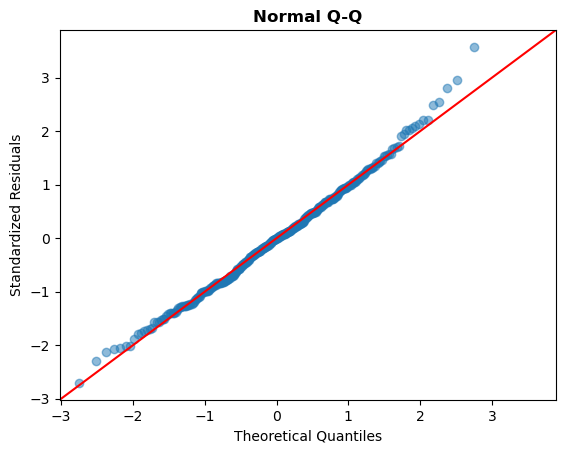

In [150]:
qq_plot(results)
stats.shapiro(np.array(results.resid))

In [151]:
vif_table(results)

,Features,VIF Factor
14,B,1.300
17,rm2,1.440
6,C(RAD)[T.7],1.940
15,rm,2.080
13,PTRATIO,2.110
9,CRIM,2.220
7,C(RAD)[T.8],2.370
18,lstat2,2.430
5,C(RAD)[T.6],2.440
1,C(RAD)[T.2],2.450


## Prediction and Confidence Interval of a prediction

In [121]:
results.get_prediction(data_test).summary_frame(alpha=0.05)

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,27.320,0.716,25.911,28.728,19.132,35.507
1,36.089,1.156,33.815,38.363,27.709,44.469
2,14.903,1.458,12.036,17.771,6.343,23.463
3,26.302,0.877,24.576,28.028,18.054,34.550
4,16.620,0.631,15.378,17.861,8.459,24.780
...,...,...,...,...,...,...
147,14.857,0.649,13.580,16.135,6.692,23.023
148,12.585,0.802,11.007,14.163,4.367,20.803
149,48.214,1.608,45.051,51.377,39.550,56.877
150,15.121,0.797,13.553,16.689,6.905,23.338


## Final Model

In [47]:
data_new = data.copy()
data_new['rm'] = data_new['RM'] - np.mean(data_new['RM'])
data_new['lstat'] =  data_new['LSTAT'] - np.mean(data_new['LSTAT'])
data_new.drop(columns=['RM', 'LSTAT'], inplace=True,)
data_new['rm2'] = np.square(data_new['rm'])
data_new['lstat2'] = np.square(data_new['lstat'])
data_new['MEDV'] = stats.boxcox(data_new['MEDV'])[0]

formula = 'MEDV ~ CRIM + NOX + DIS + C(RAD) + TAX + PTRATIO + B + rm + lstat + rm2 + lstat2'
results = smf.ols(formula, data_new).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.824
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     126.4
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          2.21e-170
Time:                        00:40:56   Log-Likelihood:                -154.66
No. Observations:                 506   AIC:                             347.3
Df Residuals:                     487   BIC:                             427.6
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        6.2146      0.297     20.948   

In [48]:
influence = OLSInfluence(results)
cooks_d = influence.cooks_distance[0]
influential_points = np.where(cooks_d > 4/data_new.shape[0])[0]
print(len(influential_points))

influential_points

27


array([  7, 141, 148, 152, 214, 364, 368, 369, 370, 371, 372, 380, 398,
       399, 400, 401, 405, 409, 410, 412, 416, 418, 426, 489, 490, 495,
       505], dtype=int64)

In [49]:
data_new = data_new.drop(influential_points).reset_index(drop=True)
data_new

,CRIM,ZN,INDUS,CHAS,NOX,AGE,DIS,RAD,TAX,PTRATIO,B,MEDV,rm,lstat,rm2,lstat2
0,0.006,18.000,2.310,0,0.538,65.200,4.090,1,296,15.300,396.900,4.573,0.290,-7.673,0.084,58.876
1,0.027,0.000,7.070,0,0.469,78.900,4.967,2,242,17.800,396.900,4.366,0.136,-3.513,0.019,12.342
2,0.027,0.000,7.070,0,0.469,61.100,4.967,2,242,17.800,392.830,5.337,0.900,-8.623,0.811,74.357
3,0.032,0.000,2.180,0,0.458,45.800,6.062,3,222,18.700,394.630,5.255,0.713,-9.713,0.509,94.344
4,0.069,0.000,2.180,0,0.458,54.200,6.062,3,222,18.700,396.900,5.429,0.862,-7.323,0.744,53.627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,0.224,0.000,9.690,0,0.585,79.700,2.498,6,391,19.200,396.900,3.890,-0.258,1.677,0.066,2.812
475,0.063,0.000,11.930,0,0.573,69.100,2.479,1,273,21.000,391.990,4.437,0.308,-2.983,0.095,8.899
476,0.045,0.000,11.930,0,0.573,76.700,2.288,1,273,21.000,396.900,4.274,-0.165,-3.573,0.027,12.767
477,0.061,0.000,11.930,0,0.573,91.000,2.167,1,273,21.000,396.900,4.565,0.691,-7.013,0.478,49.183


In [50]:
formula = 'MEDV ~ CRIM + NOX + DIS + C(RAD) + TAX + PTRATIO + B + rm + lstat + rm2 + lstat2'
results = smf.ols(formula, data_new).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   MEDV   R-squared:                       0.890
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     207.2
Date:                Mon, 04 Nov 2024   Prob (F-statistic):          1.98e-207
Time:                        00:41:10   Log-Likelihood:                 5.4722
No. Observations:                 479   AIC:                             27.06
Df Residuals:                     460   BIC:                             106.3
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        5.8532      0.224     26.115   

In [9]:
# standardised regression
data_z = data_new.select_dtypes(include=[np.number]).dropna().apply(stats.zscore)
data_z = pd.concat([data_z, data_new.select_dtypes(exclude=[np.number])], axis=1)
# smf.ols(formula, data=data_z).fit().params.to_csv("importance.csv")
print(smf.ols(formula, data=data_z).fit().params)

Intercept                        -0.341
C(RAD)[T.-0.8586604452490716]     0.179
C(RAD)[T.-0.7421587767981925]     0.392
C(RAD)[T.-0.6256571083473135]     0.254
C(RAD)[T.-0.5091554398964344]     0.283
C(RAD)[T.-0.39265377144555536]    0.176
C(RAD)[T.-0.2761521029946763]     0.344
C(RAD)[T.-0.1596504345437972]     0.203
C(RAD)[T.1.7043762606702677]      0.595
CRIM                             -0.148
NOX                              -0.138
DIS                              -0.159
TAX                              -0.141
PTRATIO                          -0.172
B                                 0.081
rm                                0.308
lstat                            -0.463
rm2                               0.273
lstat2                            0.102
dtype: float64


In [10]:
X = data_new.drop(columns='MEDV')
y = data_new['MEDV']
# Calculate Total Sum of Squares
ss_total = np.sum((y - np.mean(y)) ** 2)

# Regression Sum of Squares (Explained Sum of Squares)
ss_regression = np.sum((results.fittedvalues - np.mean(y)) ** 2)

# Residual Sum of Squares
ss_residual = np.sum(results.resid ** 2)

# Degrees of Freedom
df_regression = results.params.shape[0] - 1  # Number of predictors
df_residual = X.shape[0] - results.params.shape[0] # Total observations - predictors - intercept

# Mean Squares
ms_regression = ss_regression / df_regression
ms_residual = ss_residual / df_residual

# F-statistic
F_statistic = results.fvalue
p_value = results.f_pvalue


# Display the condensed ANOVA table
anova_table = pd.DataFrame({
    'Source': ['Regression', 'Residual'],
    'df': [df_regression, df_residual],
    'sum_sq': [ss_regression, ss_residual],
    'mean_sq': [ms_regression, ms_residual],
    'F': [F_statistic, None],
    'PR(>F)': [p_value, None]
})

# anova_table.to_csv('anova2.csv')
anova_table

,Source,df,sum_sq,mean_sq,F,PR(>F)
0,Regression,18,"31,921.174","1,773.399",238.777,0.000
1,Residual,467,"3,468.409",7.427,NaN,NaN


(66.08379899095564, 2.0533795359492838e-07, 4.089953826729465, 5.5796245789250677e-08)
(200.0946629737262, 0.0023669877391172007, 1.615434446470682, 0.00020883570879932302)


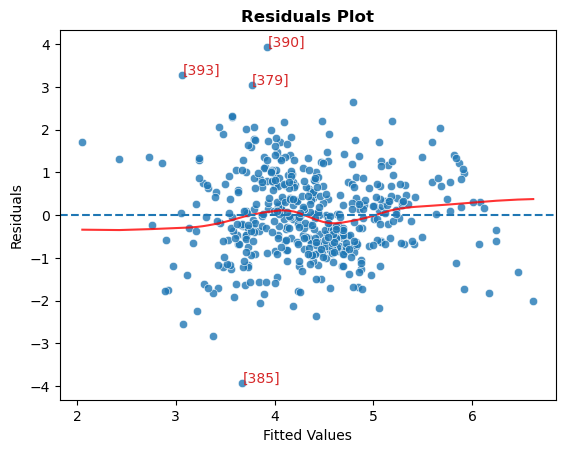

In [51]:
y_predict = results.fittedvalues
residual_plot(results, y_predict, "Fitted Values", transform=None, annot=True,)
print(het_breuschpagan(results.resid, results.get_influence().exog, robust=True))
print(het_white(results.resid,  results.model.exog))

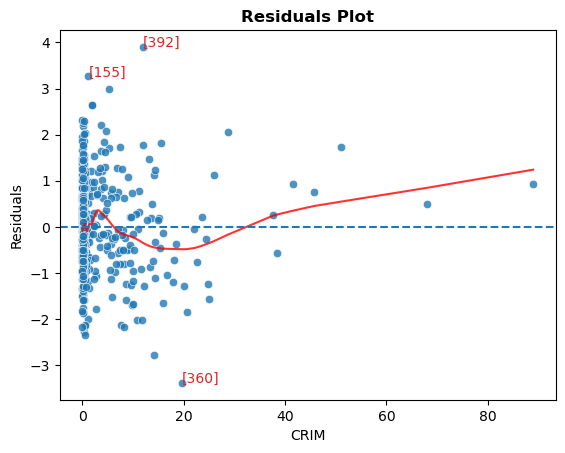

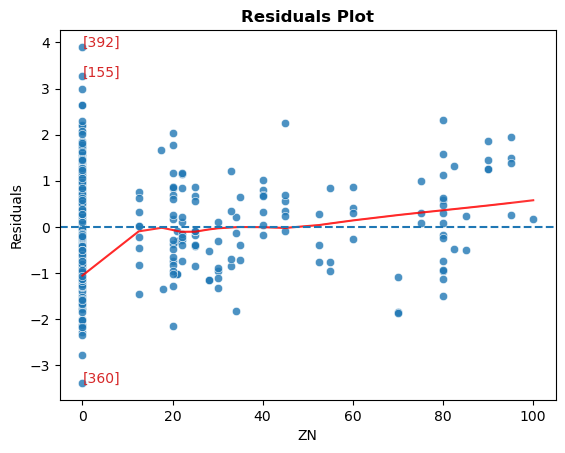

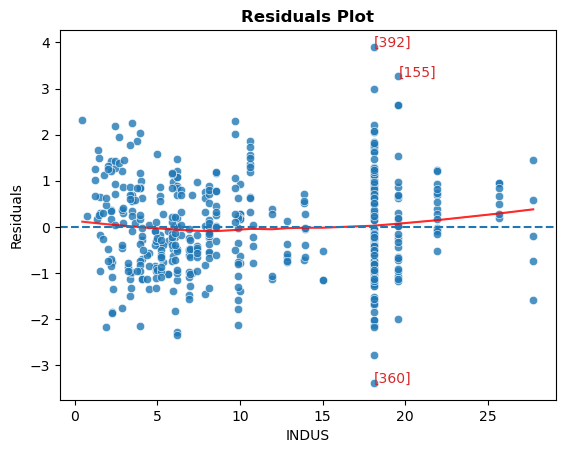

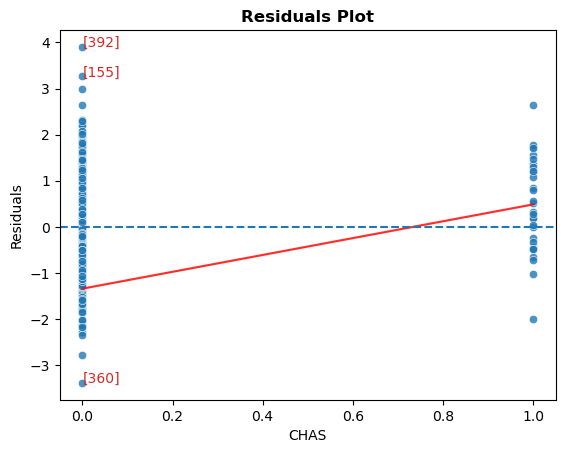

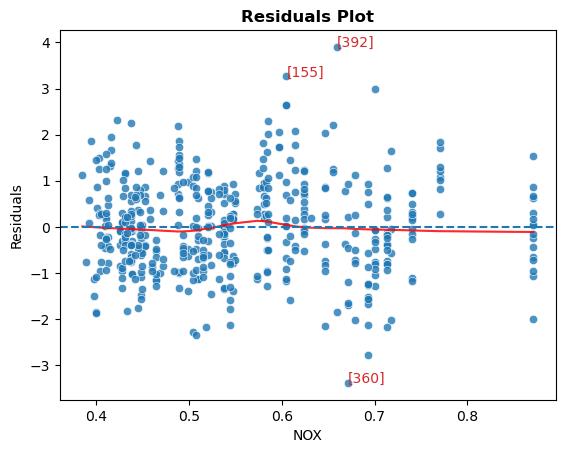

...

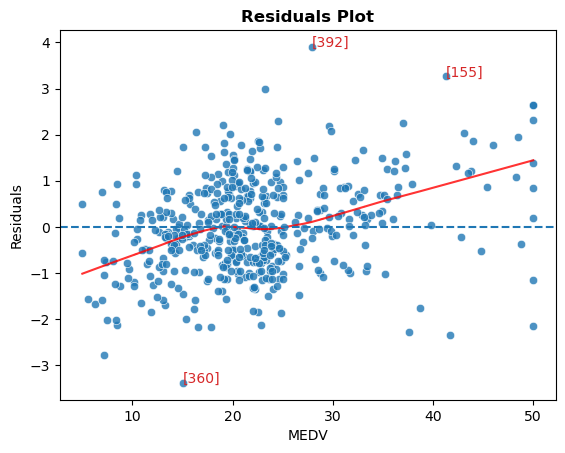

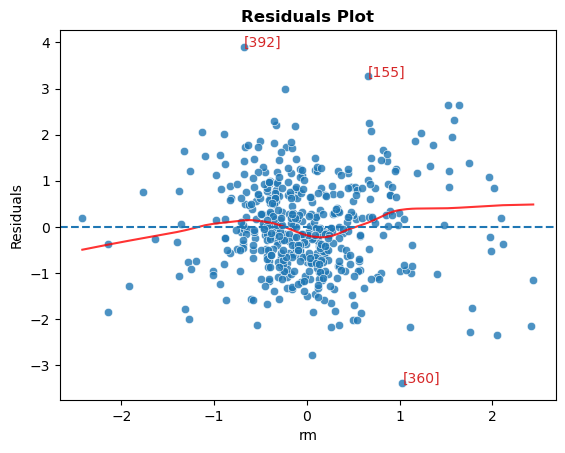

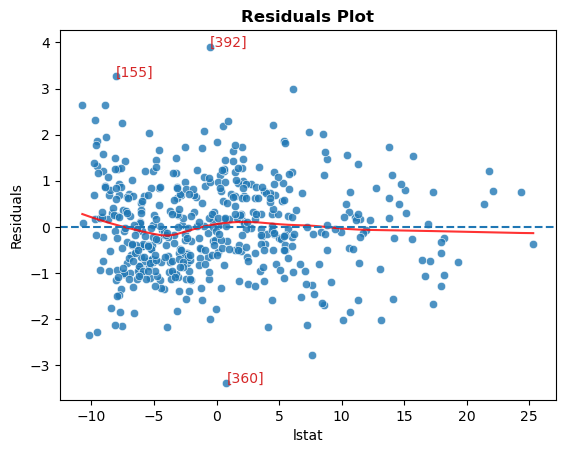

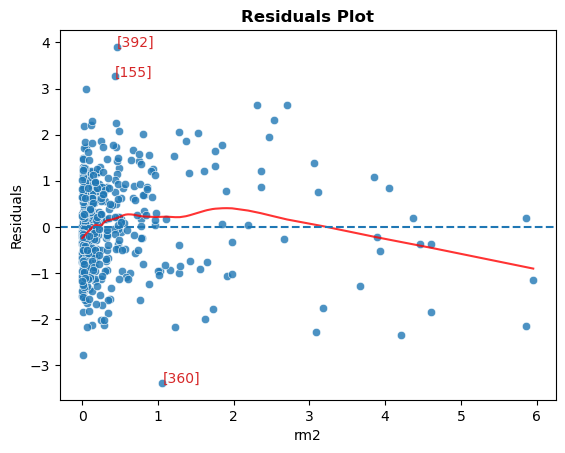

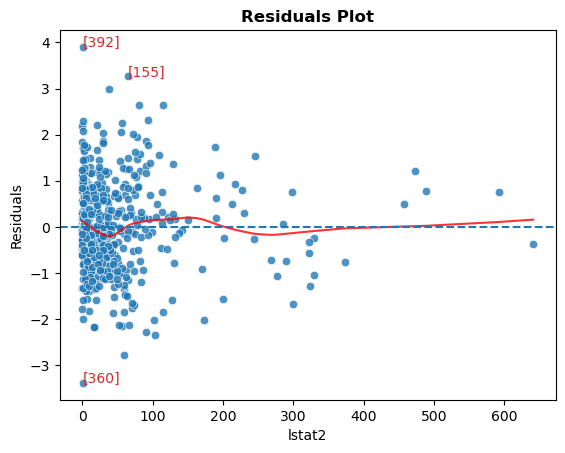

In [32]:
for x in data_new.columns:
    residual_plot(results, data_new[x], x, transform=None, annot=True)

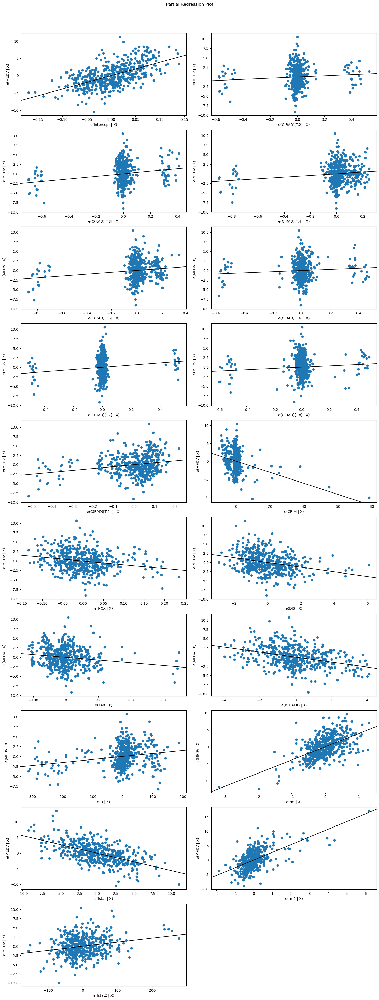

In [31]:
fig = plt.figure(figsize=(15, 40))
fig = sm.graphics.plot_partregress_grid(results, fig=fig)
# fig.tight_layout(pad=1.0)

ShapiroResult(statistic=0.9952449643552821, pvalue=0.143143958480478)

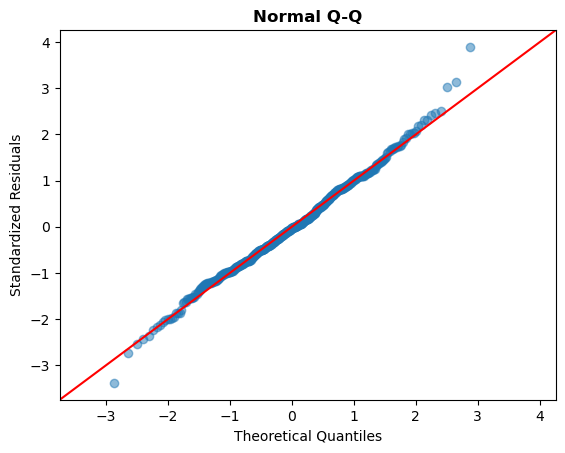

In [21]:
qq_plot(results)
stats.shapiro(np.array(results.resid))

In [174]:
# vif_table(results).to_csv("VIF.csv")
vif_table(results)

,Features,VIF Factor
14,B,1.320
17,rm2,1.500
6,C(RAD)[T.7],1.900
9,CRIM,1.920
13,PTRATIO,1.990
15,rm,2.110
18,lstat2,2.240
7,C(RAD)[T.8],2.290
1,C(RAD)[T.2],2.300
5,C(RAD)[T.6],2.440
